#### **Import Statements:**

In [ ]:
from collections import namedtuple
from enum import Enum
from PIL import Image, ImageOps
from skimage.viewer import ImageViewer
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor

import glob
import itertools
import matplotlib.pyplot as plt
import numpy as np
import os
import skimage
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data
import torchvision.transforms as transforms

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: Viewer requires Qt
  after removing the cwd from sys.path.


#### **Data Loading:**

In [ ]:
# USER CUSTOMIZATIONS - dataloader_path of images

# dir_input - stores original images
# dir_output - stores resized original images
# dir_augmented - stores dir_output after augmentations
dir_input = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 2/1-original/"
dir_output = "/content/drive/My Drive/APS360 Project Folder/Project/3. Implementation/Trial 2/2-standarized/"
dir_augmented = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 2/3-augmented/"

dataloader_path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/testing_data/"
dataloader_pkl_path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/3B-bldg-Mirror-Rotate-2K-unique.pkl"


# uncomment if using Google Colab to train
from google.colab import drive
drive.mount('/content/drive')

root = '/content/drive/My Drive/APS360 Project Folder/Project/3. Implementation/Trial 2/'

Mounted at /content/drive


In [ ]:
class DLabel(Enum):
    FAKE = 0
    REAL = 1

# (x1, y1) - top left; (x2, y2) - bottom right
RegionRect = namedtuple('RegionRect', ['x1', 'y1', 'x2', 'y2'])

New dataset used - https://www.kaggle.com/nitishabharathi/scene-classification

In [ ]:
def image_size_standarization(desired_size, from_path, to_path):
    """desired_size (int) - Provide desired dimension to scale original image to
    aspect ratio is 1:1
    from_path - dataloader_path where original images are kept
    to_path - dataloader_path where sized images are saved to"""

    print(f"Standarizing Images to {desired_size} x {desired_size} ...")
    count_r = 0
    f_iter = glob.glob(from_path + '*.jpg')
    for i in range(len(f_iter)):
        image = Image.open(f_iter[i])
        image = ImageOps.fit(
            image, size=(desired_size, desired_size), centering=(0.5, 0.5)
        )
        image.save(to_path + str(count_r) + '.png')
        count_r += 1

        if count_r % 500 == 0:
            pert = round((count_r / 2000 * 100), 2)
            print(f"{pert}% Completed.")

    print(f"Standarization Complete for {count_r} Images ")


def image_augmentation(augment_dict, from_path, to_path):
    """augment_dict (dict) - Provide a dictionary containing what augmentation is to be performed (key)
    and the values they will take on (value); adding more augmentations will require changes to function
    from_path - dataloader_path where sized images are kept (to_path from image_size_standarization())
    to_path - dataloader_path where augmented images are saved to and will be working folder to load data from"""

    combined = (
        augment_dict["Greyscale"],
        augment_dict["Mirror"],
        augment_dict["Rotation"],
    )

    combinations = list(itertools.product(*combined))
    count_comb = 0
    for k in combinations:
        count_comb += 1

    count = 0
    start_time = time.time()
    f_iter = glob.glob(from_path + '*.png')

    print(f'Total Images to be Processed: {len(f_iter)}, Images to be Created: {len(f_iter)*count_comb}')
    print(f'Starting ...')
    for i in range(len(f_iter)):

        for comb_set in combinations:
            image = Image.open(f_iter[i])

            # Greyscale
            if True in comb_set and comb_set.index(True) == 0:
                image = image.convert("LA")

            # Mirror
            if "ymirror" in comb_set and comb_set.index("ymirror") == 1:
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            elif "xmirror" in comb_set and comb_set.index("xmirror") == 1:
                image = image.transpose(Image.FLIP_TOP_BOTTOM)

            # Rotation
            if type(comb_set[1]) is int:
                image = image.rotate(comb_set[1], expand=True)

            
            image.save(to_path + str(count) + '.png')
            count += 1
        if count % (len(f_iter)*count_comb)/10 == 0:
            pert = round((count / (len(f_iter)*count_comb) * 100), 2)
            print(f"{pert}% Completed.")

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Augmentation Complete, {} Images Created".format(count))
    print("Total Time Elapsed: {:.2f} seconds".format(elapsed_time))

In [ ]:
augmentations = {
    "Greyscale": [True, False],
    "Mirror": ["ymirror", None],
    "Rotation": [180, None],
}

# augmentations = {
#     "Mirror": ["ymirror", None],
#     "Rotation": [180, None],
# }

# augmentations = {
#     "Greyscale": [True, False],
#     "Mirror": ["ymirror", None],
# }

# image_augmentation(augmentations, dir_output, dir_augmented)

In [ ]:
# Custom Dataset Class

class InpaintingDataset(Dataset):
    def __init__(self, image_dir, transform):
        self.image_dir = image_dir
        self.transform = transform
        self.image_names = os.listdir(image_dir)
        self.image_names.sort()

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        image_names = os.path.join(self.image_dir, self.image_names[idx])
        image = Image.open(image_names)

        if self.transform:
            image = self.transform(image)
        return image

# Create InpaintingDataset instance
dataset = None
# dataset = InpaintingDataset(dataloader_path, None)

In [ ]:
# Helper Functions

def missingRegion_with_mask_channel(mask, image_size, missing_image):
    """
    Returns 4 channel image with binary mask as 4th channel
    mask - binary mask (tensor)
    image_size - size of standarized image
    missing_image - tensor of image with missing region (tensor)
    """
    # Standarize greyscale images to have 3 channels
    # For greyscale images, the first dimension is the correct dimension to copy from
    # 2nd dim is a black image
    if missing_image.size()[2] < 3:
        dim1, dim2 = missing_image.unbind(2)
        dim1 = dim1.unsqueeze(-1).expand(image_size,image_size,1)
        missing_combined = torch.from_numpy(np.dstack((dim1,dim1))) #Stack channel 1
        missing_image = torch.from_numpy(np.dstack((missing_combined,dim1))) #Stack channel 2

    # Stack mask as 4th channel
    missing_image_with_mask = torch.from_numpy(np.dstack((missing_image,mask * 255)))
    missing_image_with_mask = missing_image_with_mask.permute(2,0,1)
    missing_image_with_mask = np.array(missing_image_with_mask)
    # Output - 4 x 512 x 512
    return missing_image_with_mask


def create_mask(path, mask_size, image_size, image):
    """
    Returns NamedTuple RegionRect, binary mask, and image with missing region
    dataloader_path - folder dataloader_path to working directory with augmented images
    mask_size - specified size of mask
    image_size - size of image
    image - instance of InpaintingDataset __getitem__ method
    """
    center = int(image_size / 2)
    diff = int(mask_size/2)
    x_upper_left = center - diff
    y_upper_left = center + diff
    x_lower_right = center + diff
    y_lower_right = center - diff

    # Generate boolean mask
    mask = np.zeros((image_size, image_size), dtype=bool)
    rr, cc = skimage.draw.rectangle(start=(y_upper_left, x_upper_left),
                                    end=(y_lower_right, x_lower_right))
    mask[rr, cc] = True

    # Create masked region
    image = np.array(image)
    image[mask] = 0

    # Convert image and mask to tensors
    image = torch.from_numpy(image)
    mask = torch.from_numpy(mask)
    # Populate coordiantes NamedTuple with values
    coordinates = RegionRect(x_upper_left, y_lower_right, x_lower_right, y_upper_left)

    return coordinates, mask, image


def original_image_inside_mask(path, mask_size, image_size, image):
    """
    Return an image of mask_size x mask_size
    dataloader_path - folder dataloader_path to working directory with augmented images
    mask_size - specified size of mask
    image_size - size of image
    image - instance of InpaintingDataset __getitem__ method
    """

    # Crop to mask_size (Origin starts from top left corner)
    center = int(image_size / 2)
    diff = int(mask_size/2)
    x_upper_left = center - diff
    y_upper_left = center + diff
    x_lower_right = center + diff
    y_lower_right = center - diff

    image = image.crop((x_upper_left, y_lower_right, x_lower_right, y_upper_left))

    image = torch.from_numpy(np.array(image))
    if image.size()[2] < 3:
        dim1, dim2 = image.unbind(2)
        dim1 = dim1.unsqueeze(-1).expand(mask_size,mask_size,1)
        combined = torch.from_numpy(np.dstack((dim1,dim1))) #Stack channel 1
        image = torch.from_numpy(np.dstack((combined,dim1))) #Stack channel 2

    return image


def create_combined_list(path=dataloader_path, mask_size=64, image_size=512, dataset=dataset):
    """
    Returns a nested list with length equal to number of images found in folder dataloader_path 'dataloader_path'
    Each index has 4 nested elements:
      idx[0]: original image for nth image
      idx[1]: 4 channel image with missing region and binary mask as 4th channel for nth image
      idx[2]: missing region of size mask_size x mask_size for nth image
      idx[3]: NamedTuple of binary mask coordinates

    dataset is an instance of the InpaintingDataset __getitem__ iterable method
    """
    original_image = []
    four_channel_image = []
    missing_region_image = []
    mask_coordinates = []
    count = 0
    for images in dataset:
        if count % 500 == 0:
            print(f'image number {count} processed')

        coordinates, mask, missing_image = create_mask(path, mask_size, image_size, images)
        #----------------------------------------------------------
        #----Fix Dimension # and position for Original Images------
        #----------------------------------------------------------
        images_o = torch.from_numpy(np.array(images)) #convert from PIL --> tensor
        if images_o.size()[2] < 3:
            dim1, dim2 = images_o.unbind(2)
            dim1 = dim1.unsqueeze(-1).expand(image_size,image_size,1)
            gs_combined = torch.from_numpy(np.dstack((dim1,dim1))) #Stack channel 1
            images_o = torch.from_numpy(np.dstack((gs_combined,dim1))) #Stack channel 2
            images_o = images_o.permute(2,0,1) #Stack channel 2
        else:
            images_o = images_o.permute(2,0,1)
        #----------------------------------------------------------
        # Original Images
        images_o = images_o.float() #Convert to float
        original_image.append(images_o)

        # Missing Region with blacked out region - 4 |Channel image
        with_mask = missingRegion_with_mask_channel(mask, image_size, missing_image)
        with_mask = torch.from_numpy(with_mask)
        with_mask = with_mask.float() #Convert to float
        four_channel_image.append(with_mask) # Combined Image with four channels

        #Original Image Cropped to location of binary mask
        image_in_mask = original_image_inside_mask(path, mask_size, image_size, images)
        image_in_mask = image_in_mask.permute(2,0,1)
        image_in_mask = image_in_mask.float() #Convert to float
        missing_region_image.append(image_in_mask) # Original cropped to location of binary mask

        # Coordinates (NamedTuple)
        mask_coordinates.append(coordinates) # Coordinates of blacked out region
        count += 1

    # Create nested empty list
    dataset_combined = [ [ [] for i in range(4)] for i in range(len(dataset)) ]

    for idx in range(len(dataset)):
        dataset_combined[idx][0].append(original_image[idx])
        dataset_combined[idx][1].append(four_channel_image[idx])
        dataset_combined[idx][2].append(missing_region_image[idx])
        dataset_combined[idx][3].append(mask_coordinates[idx])
    print('Completed')

    return dataset_combined


def data_loader(bs=2, path=dataloader_path, t_ind=0.75, v_ind=0.15, o_num=2, dataset=dataset):
    """
    Returns a tuple with 4 elements that is ordered as following:
    ['training', 'validation', 'testing', 'overfitting']

    Each element contains loaded datasets
    """
    start_time = time.time()
    loader = []
    t_end = int(len(dataset) * t_ind)
    v_end = int(len(dataset) * (t_ind + v_ind))

    np.random.seed(1500)  # Fixed numpy random seed for reproducible shuffling
    np.random.shuffle(dataset)
    data_split = [
        dataset[:t_end]
        , dataset[t_end:v_end]
        , dataset[v_end:]
        , dataset[:o_num]
    ]
    print(len(dataset))
    load_order = ['training', 'validation', 'testing', 'overfitting']
    order = 0
    for split in data_split:
        print(f"Loading images for {load_order[order]}. Images to be loaded: {len(data_split[order])}")
        loader.append(DataLoader(split, batch_size=bs, shuffle = True))
        order += 1

    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total Time Elapsed: {:.2f} seconds".format(elapsed_time))

    return tuple(loader)

In [ ]:
import pickle

# dataset_combined = create_combined_list(mask_size=24, image_size=128)
#
# with open(dataloader_pkl_path, 'wb') as output:
#     pickle.dump(dataset_combined, output, 4)

with open(dataloader_pkl_path, 'rb') as input:
    dataset_combined = pickle.load(input)

#### **Generator:**

In [ ]:
# # ======================== Architecture 1: Encoder + Dilation========================
# class Generator(nn.Module):
#     def __init__(self):
#         super(Generator, self).__init__()
#         self.encoder = nn.Sequential(
#             nn.Conv2d(in_channels=4,  out_channels=32, kernel_size=2, stride=1, padding=1),
#             nn.BatchNorm2d(32),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=32,  out_channels=64, kernel_size=2, stride=1, padding=1),
#             nn.BatchNorm2d(64),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=64,  out_channels=128, kernel_size=2, stride=2, padding=1),
#             nn.BatchNorm2d(128),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=128,  out_channels=256, kernel_size=2, stride=2, padding=1),
#             nn.BatchNorm2d(256),
#             nn.ReLU(True),
#         )

#         self.dilation = nn.Sequential(
#             nn.Conv2d(in_channels=256,  out_channels=256, kernel_size=2, stride=1, padding=1, dilation=4),
#             nn.BatchNorm2d(256),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=256,  out_channels=256, kernel_size=2, stride=1, padding=0, dilation=8),
#             nn.BatchNorm2d(256),
#             nn.ReLU(True),
#         )

#         # decoder here is used for decreasing number of channels, not for increasing dimension of the image
#         self.decoder = nn.Sequential(
#             nn.Conv2d(in_channels=256,  out_channels=128, kernel_size=1, stride=1, padding=0),
#             nn.BatchNorm2d(128),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=128,  out_channels=64, kernel_size=1, stride=1, padding=0),
#             nn.BatchNorm2d(64),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=64,  out_channels=32, kernel_size=1, stride=1, padding=0),
#             nn.BatchNorm2d(32),
#             nn.ReLU(True),
#             nn.Conv2d(in_channels=32,  out_channels=3, kernel_size=1, stride=1, padding=0),
#             nn.Tanh()
#         )

#     def forward(self, x):
#         x = self.encoder(x)
#         x = self.dilation(x)
#         x = self.decoder(x)
#         return x

# ======================== Architecture 2: Autoencoder + Dilation ========================
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=4,  out_channels=32, kernel_size=2, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(in_channels=32,  out_channels=64, kernel_size=2, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(in_channels=64,  out_channels=128, kernel_size=2, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(in_channels=128,  out_channels=256, kernel_size=2, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
        )

        self.dilation = nn.Sequential(
            nn.Conv2d(in_channels=256,  out_channels=256, kernel_size=2, stride=1, padding=1, dilation=4),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(in_channels=256,  out_channels=256, kernel_size=2, stride=1, padding=1, dilation=8),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.Conv2d(in_channels=256,  out_channels=256, kernel_size=2, stride=1, padding=1, dilation=16),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=256,  out_channels=128, kernel_size=1, stride=1, padding=0, output_padding=0),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=128,  out_channels=64, kernel_size=1, stride=1, padding=0, output_padding=0),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=64,  out_channels=32, kernel_size=1, stride=1, padding=0, output_padding=0),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(in_channels=32,  out_channels=3, kernel_size=2, stride=2, padding=0, output_padding=0),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.dilation(x)
        x = self.decoder(x)
        return x

#### **Discriminator:**

In [ ]:
# 2 convolutional layers, this perfomed better than the 5 layered architecture
# during the overfitting test
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential (
        nn.Conv2d(in_channels=3,  out_channels=8, kernel_size=5, stride=2, padding=1),
        nn.BatchNorm2d(8),
        nn.LeakyReLU(),
        nn.Conv2d(in_channels=8, out_channels=16, kernel_size=5, stride=2, padding=0),
        nn.BatchNorm2d(16),
        nn.LeakyReLU()
    )
    self.fc1 = nn.Sequential (
        nn.Linear(16*30*30, 128),
        nn.LeakyReLU(),
        nn.Linear(128,1),
        nn.Sigmoid()
    )

  def forward(self, x):
    x = self.main(x)
    x = x.view(-1, 16*30*30)
    x = self.fc1(x)
    return x

#### **Accuracy functions:**

In [ ]:
def compute_G_accuracy(G_model, D_model, dataset, is_use_cuda):
    acc, total = 0, 0
    for i, data in enumerate(dataset, 0):
        original_image, masked_image, _, _ = data

        masked_image = masked_image[0]
        original_image = original_image[0]

        if is_use_cuda and torch.cuda.is_available():
            masked_image = masked_image.cuda()
            original_image = original_image.cuda()

        # get output from generator
        G_output = G_model(masked_image)
        G_output = (G_output * 127.5) + 127.5
        G_output = F.pad(G_output, pad=[52, 52, 52, 52], mode='constant', value=0)

        G_output[:, :, 0:128, 0:52] = original_image[:, :, 0:128, 0:52]
        G_output[:, :, 0:128, 76:128] = original_image[:, :, 0:128, 76:128]
        G_output[:, :, 0:52, 52:76] = original_image[:, :, 0:52, 52:76]
        G_output[:, :, 76:128, 52:76] = original_image[:, :, 76:128, 52:76]

        # get classification result from  discriminator
        D_output = D_model(G_output)
        D_output = D_output.detach().cpu().numpy()

        # calculate acc for image classification
        for i in range(D_output.shape[0]):
            acc += int(D_output[i] > 0.5)
            total += 1

        return acc / total

In [ ]:
def compute_D_accuracy(G_model, D_model, dataset, is_use_cuda):
    acc_real, acc_fake, total_real, total_fake, total_acc = 0, 0, 0 ,0, 0

    # iterate across dataset batches to obtain number of correct classifications
    for i, data in enumerate(dataset, 0):
        original_image, masked_image, _, _ = data 

        masked_image = masked_image[0]
        original_image = original_image[0]

        if is_use_cuda and torch.cuda.is_available():
            masked_image = masked_image.cuda()
            original_image = original_image.cuda()

        # get output from model 
        G_output = G_model(masked_image)
        G_output = (G_output * 127.5) + 127.5
        G_output = F.pad(G_output, pad=[52, 52, 52, 52], mode='constant', value=0)

        G_output[:, :, 0:128, 0:52] = original_image[:, :, 0:128, 0:52]
        G_output[:, :, 0:128, 76:128] = original_image[:, :, 0:128, 76:128]
        G_output[:, :, 0:52, 52:76] = original_image[:, :, 0:52, 52:76]
        G_output[:, :, 76:128, 52:76] = original_image[:, :, 76:128, 52:76]

        # get loss for real images
        output_real = D_model(original_image)
        numpy_output_real = output_real.detach().cpu().numpy()
        # calculate acc for real image classification
        for i in range(numpy_output_real.shape[0]):
            acc_real += int(numpy_output_real[i] > 0.5)
            total_real += 1

        # get loss for fake images
        output_fake = D_model(G_output)
        numpy_output_fake = output_fake.detach().cpu().numpy()
        # calculate acc for fake image classification
        for i in range(numpy_output_fake.shape[0]):
            acc_fake += int(numpy_output_fake[i] < 0.5)
            total_fake += 1

        # calculate total accuracy
        total_acc = (acc_real + acc_fake) / (total_real + total_fake)
        return total_acc              

#### **Loss functions:**

In [ ]:
def compute_G_loss(G_model, D_model, criterion, dataset, is_use_cuda, device):
    i = 0
    total_loss = 0.0
    
    for i, data in enumerate(dataset, 0):
        original_image, masked_image, _, _ = data

        masked_image = masked_image[0]
        original_image = original_image[0]

        if is_use_cuda and torch.cuda.is_available():
            masked_image = masked_image.cuda()
            original_image = original_image.cuda()

        # get output from generator
        G_output = G_model(masked_image)
        G_output = (G_output * 127.5) + 127.5
        G_output = F.pad(G_output, pad=[52, 52, 52, 52], mode='constant', value=0)

        G_output[:, :, 0:128, 0:52] = original_image[:, :, 0:128, 0:52]
        G_output[:, :, 0:128, 76:128] = original_image[:, :, 0:128, 76:128]
        G_output[:, :, 0:52, 52:76] = original_image[:, :, 0:52, 52:76]
        G_output[:, :, 76:128, 52:76] = original_image[:, :, 76:128, 52:76]

        # get output from discriminator
        D_output = D_model(G_output)

        # get loss for each output and the total loss
        loss = criterion(D_output, generate_binary_label(DLabel.REAL, len(D_output), device))
        total_loss += loss.item()
    
    # get average loss from total loss
    total_loss = float(total_loss) / (i+1)
    return total_loss

In [ ]:
def compute_D_loss(G_model, D_model, criterion, dataset, is_use_cuda, device):
    i = 0
    total_loss = 0.0

    for i, data in enumerate(dataset, 0):
        original_image, masked_image, _, _ = data 

        masked_image = masked_image[0]
        original_image = original_image[0]

        if is_use_cuda and torch.cuda.is_available():
            masked_image = masked_image.cuda()
            original_image = original_image.cuda()

        # get output images from generator
        G_output = G_model(masked_image)  
        G_output = (G_output * 127.5) + 127.5
        G_output = F.pad(G_output, pad=[52, 52, 52, 52], mode='constant', value=0)

        G_output[:, :, 0:128, 0:52] = original_image[:, :, 0:128, 0:52]
        G_output[:, :, 0:128, 76:128] = original_image[:, :, 0:128, 76:128]
        G_output[:, :, 0:52, 52:76] = original_image[:, :, 0:52, 52:76]
        G_output[:, :, 76:128, 52:76] = original_image[:, :, 76:128, 52:76]

        # get loss for real images
        output_real = D_model(original_image)
        loss_real = criterion(output_real, generate_binary_label(DLabel.REAL, len(output_real), device))

        # get loss for fake images
        output_fake = D_model(G_output)
        loss_fake = criterion(output_fake, generate_binary_label(DLabel.FAKE, len(output_fake), device))

        # get total loss
        D_loss = loss_real.item() + loss_fake.item()
        total_loss += D_loss
        
    # get average loss from total loss
    total_loss = float(total_loss) / (i+1)
    return total_loss

#### **Helper Functions:**

In [ ]:
def generate_binary_label(dlabel, n, device):
    if dlabel.value == 0:
        return torch.zeros([n, 1], device=device)
    elif dlabel.value == 1:
        return torch.ones([n, 1], device=device)

In [ ]:
def plot_training_curves(train_acc_csv_path=None, train_loss_csv_path=None,
                         valid_acc_csv_path=None, valid_loss_csv_path=None):
    import matplotlib.pyplot as plt

    # plot 1 - Training vs Validation Accuracy
    if train_acc_csv_path or valid_acc_csv_path:
        if train_acc_csv_path:
            train_acc = np.loadtxt(train_acc_csv_path, delimiter=',').transpose()
            plt.plot(train_acc[0], train_acc[1], label="Train")

        if valid_acc_csv_path:
            val_acc = np.loadtxt(valid_acc_csv_path, delimiter=',').transpose()
            plt.plot(val_acc[0], val_acc[1], label="Validation")

        plt.title("Training Curve - Accuracy")
        plt.xlabel("Iterations")
        plt.ylabel("Accuracy")
        plt.legend(loc='best')

        plt.show()

    # plot 2 - Training vs Validation Loss
    if train_loss_csv_path or valid_loss_csv_path:
        if train_loss_csv_path:
            train_loss = np.loadtxt(train_loss_csv_path, delimiter=',').transpose()
            plt.plot(train_loss[0], train_loss[1], label="Train")

        if valid_loss_csv_path:
            val_loss = np.loadtxt(valid_loss_csv_path, delimiter=',').transpose()
            plt.plot(val_loss[0], val_loss[1], label="Validation")

        plt.title("Training Curve - Loss")
        plt.xlabel("Iterations")
        plt.ylabel("Loss")
        plt.legend(loc='best')

        plt.show()

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# pixel by pixel loss 
def pixel_loss(original_img, generated_img, use_cuda=False):
  """ Returns the loss from pixel by pixel comaparison for one image.
      orginal_img - the img from dataset
      generated_img - the img produced by generator
  """
  if use_cuda and torch.cuda.is_available():
    original_img = original_img.cuda()
    generated_img = generated_img.cuda()

  difference = (original_img - generated_img)**2
  diff = (torch.sum(difference))

  return diff.item()

def batch_pixel_loss(original_imgs, generated_imgs):
  """ Returns the loss from pixel by pixel comaparison for one batch.
      orginal_img - the batch of imgs from dataset
      generated_img - the batch of imgs produced by generator
  """

  loss = 0
  for i in range(original_imgs.shape[0]):
    loss += pixel_loss(original_imgs[i], generated_imgs[i])
  
  return loss/original_imgs.shape[0]


# pixel by pixel accuracy 
def pixel_accuracy(original_img, generated_img, use_cuda=False):
  """ Returns the accuracy from pixel by pixel comaparison for one image.
      orginal_img - the img from dataset
      generated_img - the img produced by generator
  """
  if use_cuda and torch.cuda.is_available():
    original_img = original_img.cuda()
    generated_img = generated_img.cuda()

  difference = original_img - generated_img
  difference = torch.abs(difference)
  # print(original_img)
  # print(generated_img)
  # print(torch.sum(difference))
  diff = 1 - (torch.sum(difference)/(24*24))

  return diff.item()

def batch_pixel_accuracy(original_imgs, generated_imgs):
  """ Returns the accuracy from pixel by pixel comaparison for one batch.
      orginal_img - the batch of imgs from dataset
      generated_img - the batch of imgs produced by generator
  """

  accuracy = 0
  for i in range(original_imgs.shape[0]):
    accuracy += pixel_accuracy(original_imgs[i], generated_imgs[i])
  
  return accuracy/original_imgs.shape[0]

def compute_pixel_loss_accuracy(G_model, dataset, is_use_cuda):
    loss, acc, total = 0, 0, 0
    for i, data in enumerate(dataset, 0):
        original_image, masked_image, _, _ = data

        masked_image = masked_image[0]
        original_image = original_image[0][:, :, 52:76, 52:76]

        if is_use_cuda and torch.cuda.is_available():
            masked_image = masked_image.cuda()
            original_image = original_image.cuda()

        # get output from generator
        G_output = G_model(masked_image)
        G_output = (G_output * 127.5) + 127.5

        loss += batch_pixel_loss(original_image/255, G_output/255)
        acc += batch_pixel_accuracy(original_image/255, G_output/255)
        total += 1

    return (loss/total, acc/total)

#### **Baseline Model:**


In [ ]:
import cv2 as cv
from PIL import Image
from torchvision.utils import save_image
from google.colab.patches import cv2_imshow

def processBaseline(imgs, is_use_cuda):
  """Function returns a batch of images with missing regions and their respective
     binary mask in a tuple.

     imgs - a pytorch
     rect_regions - a list of RegionRect namedtuple detailing location of missing
                   region with the size of the list being the batch size
  """

  # region_rects = []

  # for rects in range(len(give_rects[0][0])):
  #     temp = []
  #     for val in range(4):
  #       temp.append(give_rects[0][val][rects].item())
  #     region_rects.append(temp)


  binary_masks = torch.zeros(imgs.shape[0], 1, imgs.shape[2], imgs.shape[3])
  missing_imgs = torch.zeros(imgs.shape)

  if is_use_cuda and torch.cuda.is_available():
      binary_masks = binary_masks.cuda()
      missing_imgs = missing_imgs.cuda()

  # w = abs(region_rects[j][2]-region_rects[j][0])
  # h = abs(region_rects[j][3]-region_rects[j][1])

  local_mask = torch.ones(1,24,24)
  # left = region_rects[j][0]
  # right = abs(imgs.shape[3]-region_rects[j][2])
  # top = region_rects[j][1]
  # bottom = abs(imgs.shape[2]-region_rects[j][3])
  local_mask = F.pad(input=local_mask, pad=(52, 52, 52, 52), mode='constant', value=0)
  binary_masks = local_mask

  global_mask = torch.zeros(imgs.shape[1],24,24)
  global_mask = F.pad(input=global_mask, pad=(52, 52, 52, 52), mode='constant', value=1)
  missing_imgs = (imgs*global_mask)


  return (binary_masks, missing_imgs)

def baseline(batch, index, missing_imgs, masks, original_imgs, blur, is_use_cuda):
  """ Returns accuracy for baseline model for given a single img or a batch.
      batch - True if baseline accuracy for batch is wanted
      index - if batch is false, then the index is used for the image to be inpainted
      imgs - images with missing regions
      masks - binary mask for the missing regions
      orginal_imgs - without missing region
      blur - Radius of a circular neighborhood of each point inpainted that is
            considered by the inpaint opencv algorithm.
  """
  if is_use_cuda and torch.cuda.is_available():
      missing_imgs = missing_imgs.cuda()
      masks = masks.cuda()
      original_imgs = original_imgs.cuda()


  if not batch:
    img1 = missing_imgs[index]
    save_image(img1, 'img1.png')
    mask1 = masks
    save_image(mask1, 'mask1.png')
    img1 = cv.imread("img1.png")
    mask1 = cv.imread("mask1.png", 0)

    dst = cv.inpaint(img1,mask1,blur,cv.INPAINT_TELEA)

    result=cv.imwrite(r'temp.png', dst)
    if not result:
      print("Error in saving file")
      return

    # cv2_imshow(dst)
    # cv.waitKey(0)
    # cv.destroyAllWindows()

    dst = Image.open('temp.png')
    transform = transforms.ToTensor()
    tensor_dst = transform(dst)

    return (pixel_accuracy(original_imgs[index]/255, tensor_dst, is_use_cuda), tensor_dst)
  else:
    generated_imgs = torch.ones(original_imgs.shape)
    if is_use_cuda and torch.cuda.is_available():
      generated_imgs = generated_imgs.cuda()

    transform = transforms.ToTensor()

    for i in range(original_imgs.shape[0]):
      img1 = missing_imgs[i]
      save_image(img1, 'img1.png')
      mask1 = masks
      save_image(mask1, 'mask1.png')

      img1 = cv.imread("img1.png")
      mask1 = cv.imread("mask1.png", 0)

      dst = cv.inpaint(img1,mask1,blur,cv.INPAINT_TELEA)

      result=cv.imwrite(r'temp.png', dst)
      if not result:
        print("Error in saving file")
        return

      # cv2_imshow(dst)
      # cv.waitKey(0)
      # cv.destroyAllWindows()

      dst = Image.open('temp.png')
      generated_imgs[i] = transform(dst)

    return batch_pixel_accuracy(original_imgs/255, generated_imgs)

def displayCompare(test_dataset, g_model):
  for oriimgs, preprocimgs, _, _ in test_dataset:
    for i in range(oriimgs[0].shape[0]):
      index = i
      masks, missing_imgs = processBaseline(oriimgs[0]/255, False)
      acc_b, output_b =  baseline(False, index, missing_imgs, masks, oriimgs[0], 5, False)
      output_g = g_model(preprocimgs[0].cuda())
      output_g = (output_g * 127.5) + 127.5
      output_g = F.pad(output_g, pad=[52, 52, 52, 52], mode='constant', value=0)
      output_g[:, :, 0:128, 0:52] = oriimgs[0][:, :, 0:128, 0:52]
      output_g[:, :, 0:128, 76:128] = oriimgs[0][:, :, 0:128, 76:128]
      output_g[:, :, 0:52, 52:76] = oriimgs[0][:, :, 0:52, 52:76]
      output_g[:, :, 76:128, 52:76] = oriimgs[0][:, :, 76:128, 52:76]
      acc_g = pixel_accuracy(oriimgs[0][index]/255, output_g[index]/255, is_use_cuda)

      fig = plt.figure(figsize=(15, 15))
      fig.add_subplot(1, 5, 1)
      plt.imshow(np.transpose(output_b, (1, 2, 0)))
      fig.add_subplot(1, 5, 2)
      plt.imshow(np.transpose(output_g[index].detach().cpu() / 255, (1, 2, 0)))
      fig.add_subplot(1, 5, 3)
      plt.imshow(np.transpose(oriimgs[0][index]/255, (1, 2, 0)))
      fig.add_subplot(1, 5, 4)
      plt.imshow(np.transpose(output_g[index][:, 52:76, 52:76].detach().cpu() / 255,
                                            (1, 2, 0)))
      fig.add_subplot(1, 5, 5)
      plt.imshow(np.transpose(oriimgs[0][index][:, 52:76, 52:76].detach().cpu() / 255,
                                            (1, 2, 0)))
      
      plt.show()

      print("Baseline Acc:", round(acc_b,5), "  Model Acc:", round(acc_g,5), "  Original Image", " Generated missing area", " Label of missing area")

def dataset_acc(dataset):
    acc, total = 0, 0
    for oriimgs, preprocimgs, _, _ in dataset:

        masks, missing_imgs = processBaseline(oriimgs[0]/255, False)
        acc += baseline(True, 0, missing_imgs, masks, oriimgs[0], 5, False)
        total += 1

    return acc/total
  

#### **Results:**


In [ ]:
# load the best model 
g_model1 = Generator()
g_model1.eval()
g_model1.cuda()
#path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/Kevin/trained_models_bldg_rgb-gED_d2L-ne1000_G_ne2000_niter24000_e2000_iter24000"
#path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/Kevin/trained_models_final_G_ne2000_niter24000_e2000_iter24000"
# path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/Kevin/trained_models_bldg_rgb-gED_d2L-ne1000_G_ne2000_niter24000_e2000_iter24000_lr0.0008"
path = "/content/drive/MyDrive/APS360 Project Folder/Project/3. Implementation/Trial 3/Kevin/Kevin_v3.3-autoencoder--2k-unique-lr0.0008-model"
state = torch.load(path)
g_model1.load_state_dict(state)

<All keys matched successfully>

2000
Loading images for training. Images to be loaded: 1500
Loading images for validation. Images to be loaded: 300
Loading images for testing. Images to be loaded: 200
Loading images for overfitting. Images to be loaded: 16
Total Time Elapsed: 0.00 seconds


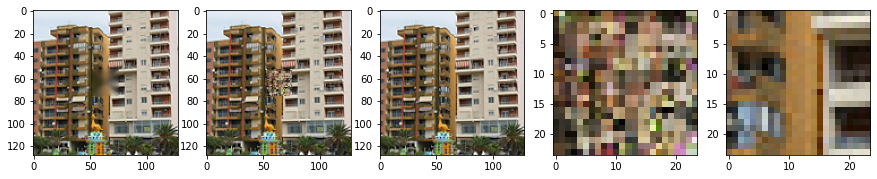

Baseline Acc: 0.53182   Model Acc: 0.3619   Original Image  Generated missing area  Label of missing area


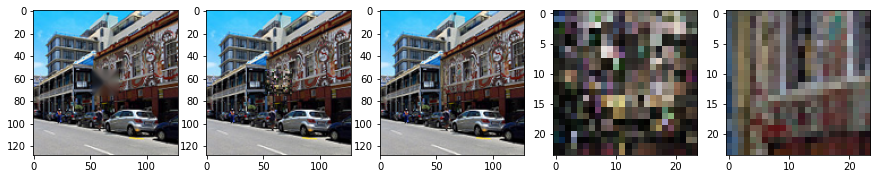

Baseline Acc: 0.63459   Model Acc: 0.4627   Original Image  Generated missing area  Label of missing area


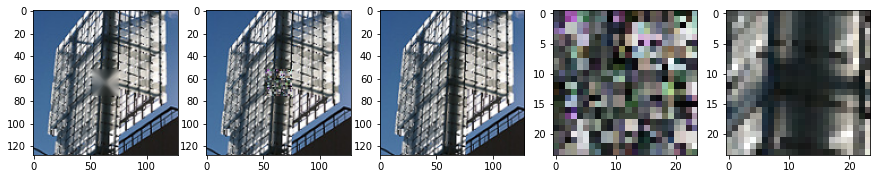

Baseline Acc: 0.43708   Model Acc: 0.27242   Original Image  Generated missing area  Label of missing area


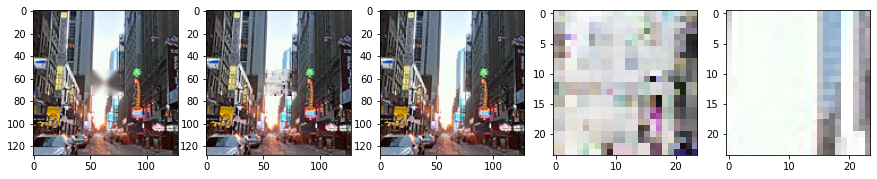

Baseline Acc: 0.31556   Model Acc: 0.43712   Original Image  Generated missing area  Label of missing area


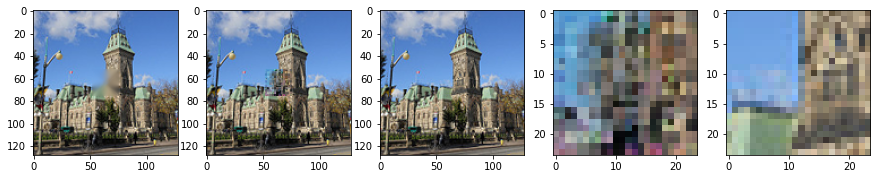

Baseline Acc: 0.73737   Model Acc: 0.45905   Original Image  Generated missing area  Label of missing area


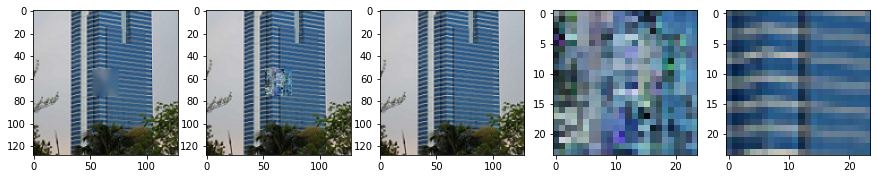

Baseline Acc: 0.72807   Model Acc: 0.50541   Original Image  Generated missing area  Label of missing area


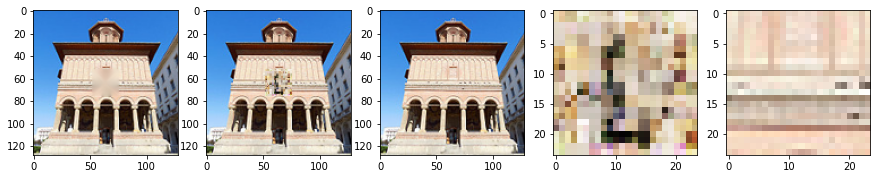

Baseline Acc: 0.77709   Model Acc: 0.45943   Original Image  Generated missing area  Label of missing area


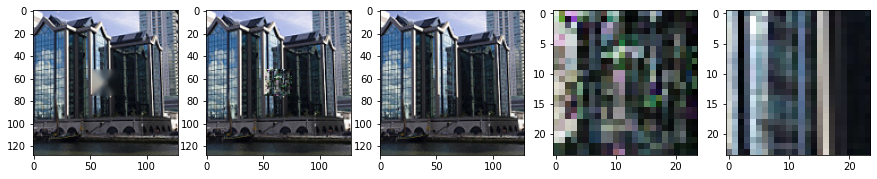

Baseline Acc: 0.53431   Model Acc: 0.33636   Original Image  Generated missing area  Label of missing area


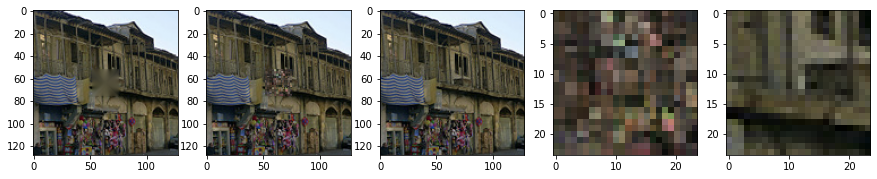

Baseline Acc: 0.72394   Model Acc: 0.65465   Original Image  Generated missing area  Label of missing area


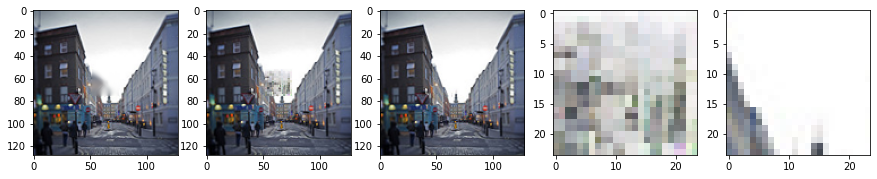

Baseline Acc: 0.68536   Model Acc: 0.38879   Original Image  Generated missing area  Label of missing area


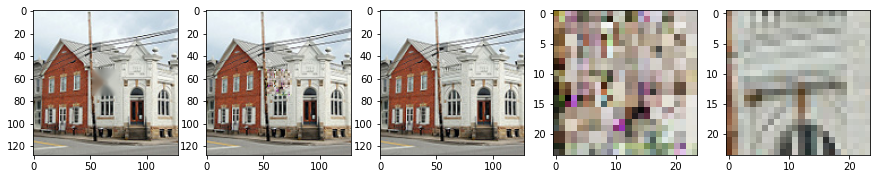

Baseline Acc: 0.62425   Model Acc: 0.52001   Original Image  Generated missing area  Label of missing area


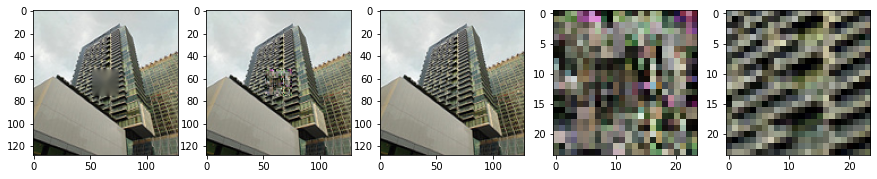

Baseline Acc: 0.46042   Model Acc: 0.28235   Original Image  Generated missing area  Label of missing area


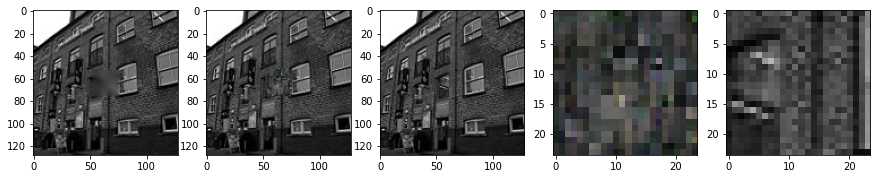

Baseline Acc: 0.73196   Model Acc: 0.65934   Original Image  Generated missing area  Label of missing area


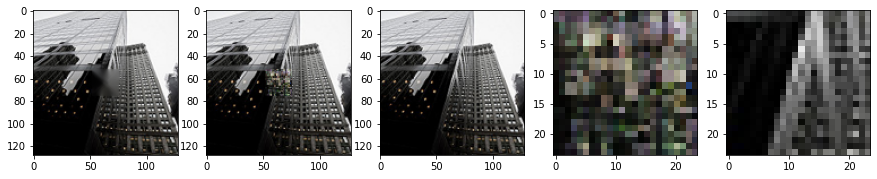

Baseline Acc: 0.66694   Model Acc: 0.41043   Original Image  Generated missing area  Label of missing area


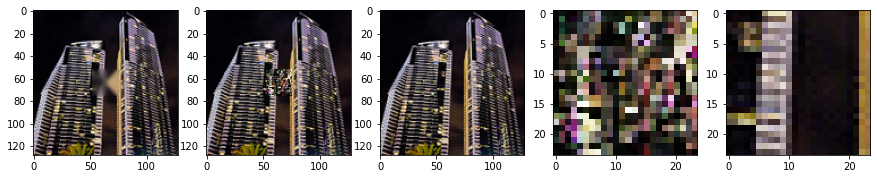

Baseline Acc: 0.30555   Model Acc: 0.19608   Original Image  Generated missing area  Label of missing area


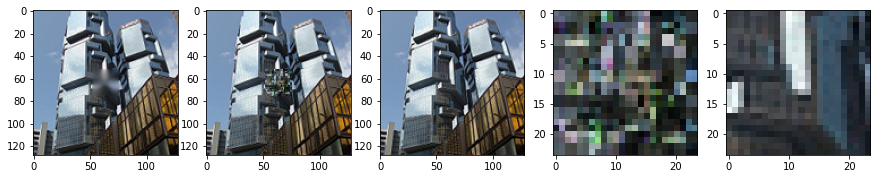

Baseline Acc: 0.60101   Model Acc: 0.40828   Original Image  Generated missing area  Label of missing area


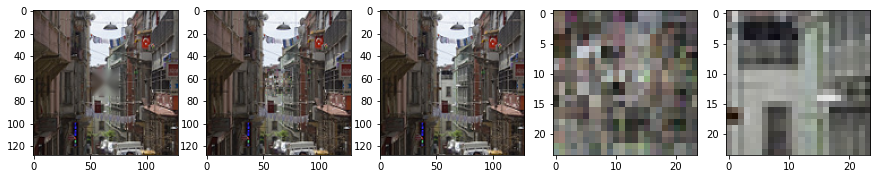

Baseline Acc: 0.53597   Model Acc: 0.52577   Original Image  Generated missing area  Label of missing area


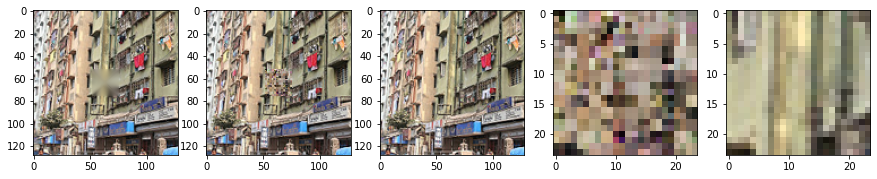

Baseline Acc: 0.67047   Model Acc: 0.47995   Original Image  Generated missing area  Label of missing area


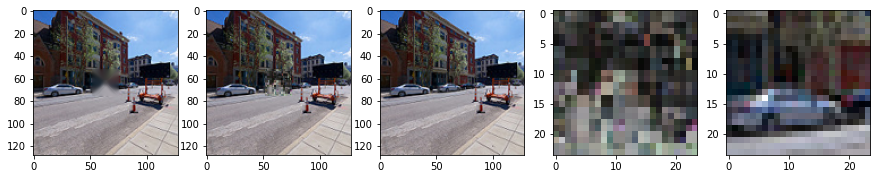

Baseline Acc: 0.67652   Model Acc: 0.5644   Original Image  Generated missing area  Label of missing area


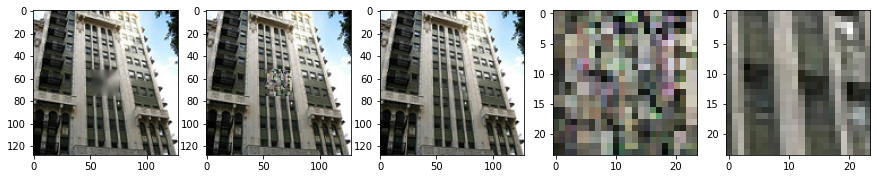

Baseline Acc: 0.54129   Model Acc: 0.35741   Original Image  Generated missing area  Label of missing area


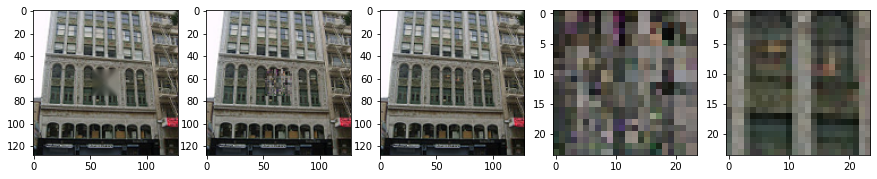

Baseline Acc: 0.61454   Model Acc: 0.53164   Original Image  Generated missing area  Label of missing area


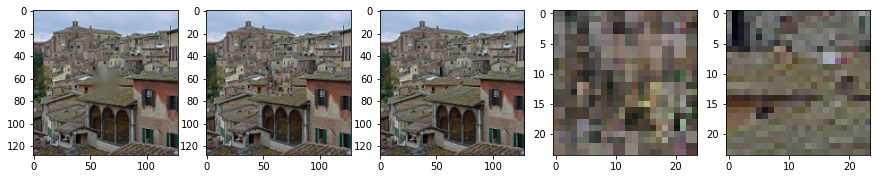

Baseline Acc: 0.80703   Model Acc: 0.67496   Original Image  Generated missing area  Label of missing area


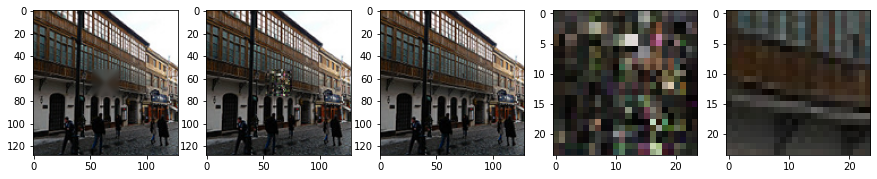

Baseline Acc: 0.80244   Model Acc: 0.64999   Original Image  Generated missing area  Label of missing area


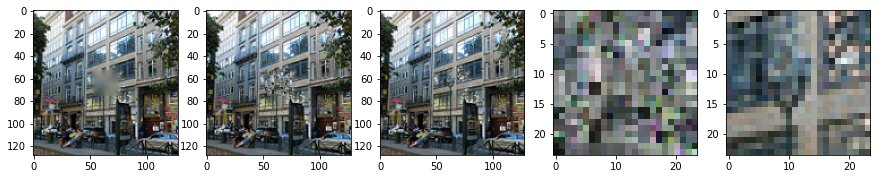

Baseline Acc: 0.61025   Model Acc: 0.45619   Original Image  Generated missing area  Label of missing area


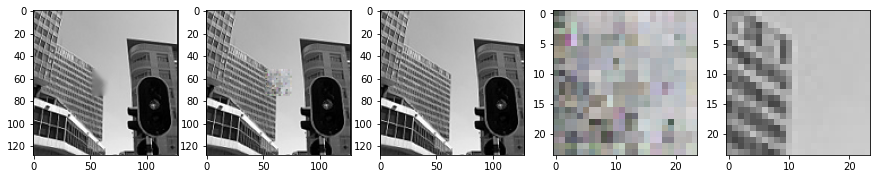

Baseline Acc: 0.81695   Model Acc: 0.70491   Original Image  Generated missing area  Label of missing area


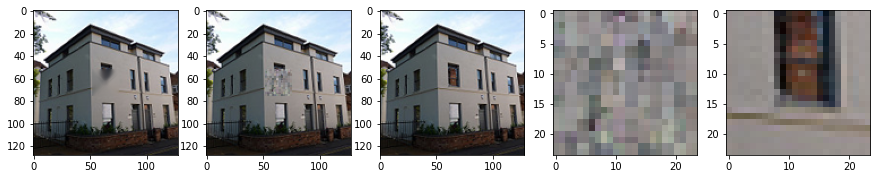

Baseline Acc: 0.72288   Model Acc: 0.60016   Original Image  Generated missing area  Label of missing area


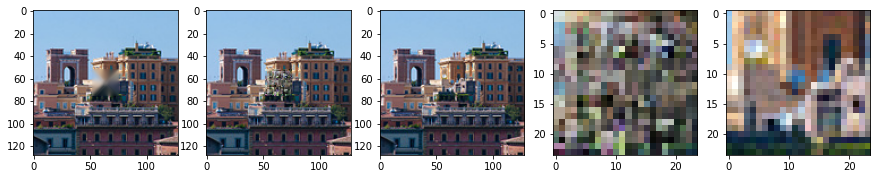

Baseline Acc: 0.4678   Model Acc: 0.35352   Original Image  Generated missing area  Label of missing area


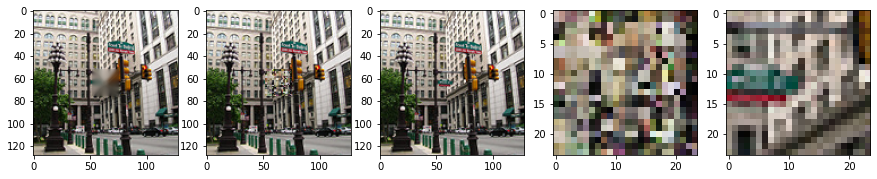

Baseline Acc: 0.45678   Model Acc: 0.22826   Original Image  Generated missing area  Label of missing area


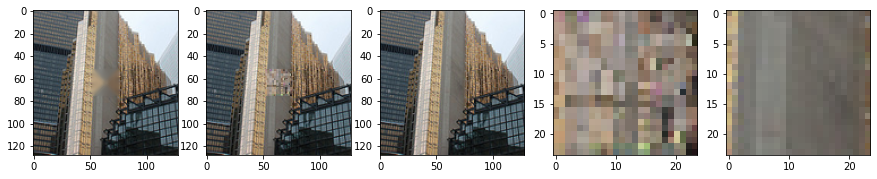

Baseline Acc: 0.85813   Model Acc: 0.67039   Original Image  Generated missing area  Label of missing area


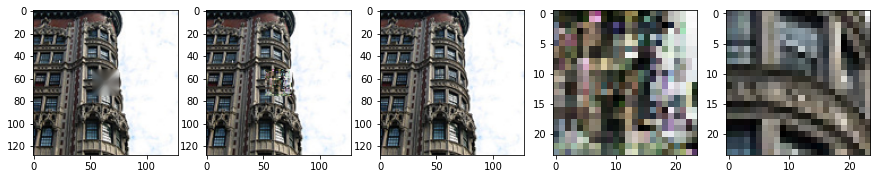

Baseline Acc: 0.43283   Model Acc: 0.18238   Original Image  Generated missing area  Label of missing area


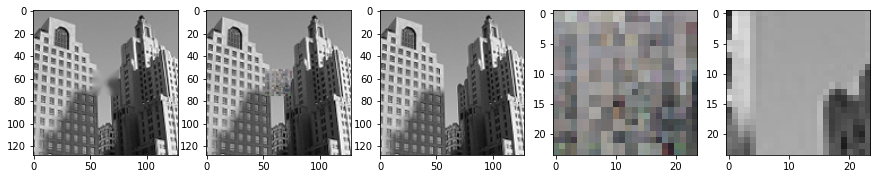

Baseline Acc: 0.74775   Model Acc: 0.61126   Original Image  Generated missing area  Label of missing area


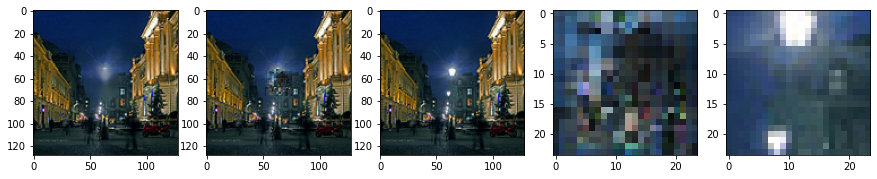

Baseline Acc: 0.79833   Model Acc: 0.54065   Original Image  Generated missing area  Label of missing area


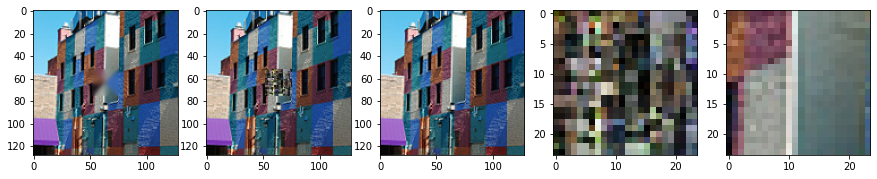

Baseline Acc: 0.63199   Model Acc: 0.32861   Original Image  Generated missing area  Label of missing area


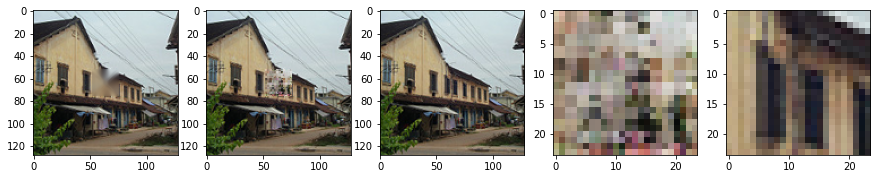

Baseline Acc: 0.45316   Model Acc: 0.26104   Original Image  Generated missing area  Label of missing area


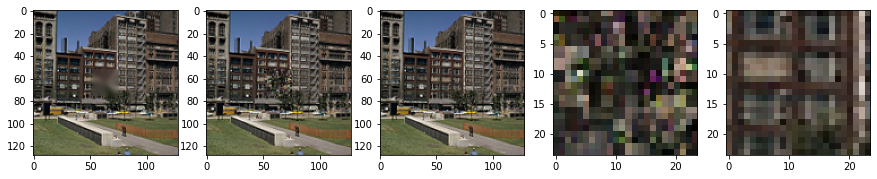

Baseline Acc: 0.70679   Model Acc: 0.55591   Original Image  Generated missing area  Label of missing area


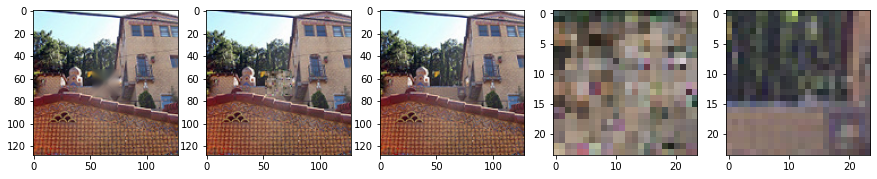

Baseline Acc: 0.75272   Model Acc: 0.53603   Original Image  Generated missing area  Label of missing area


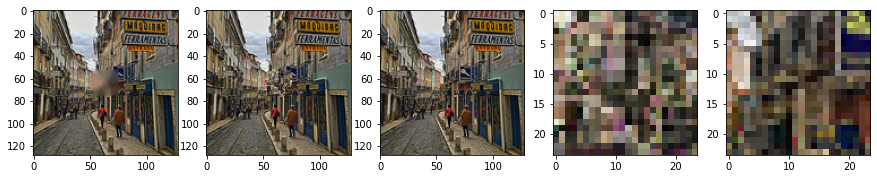

Baseline Acc: 0.57287   Model Acc: 0.43538   Original Image  Generated missing area  Label of missing area


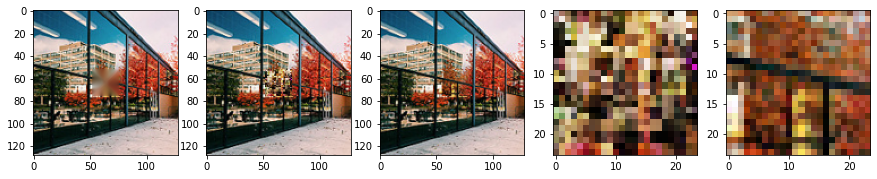

Baseline Acc: 0.51844   Model Acc: 0.25009   Original Image  Generated missing area  Label of missing area


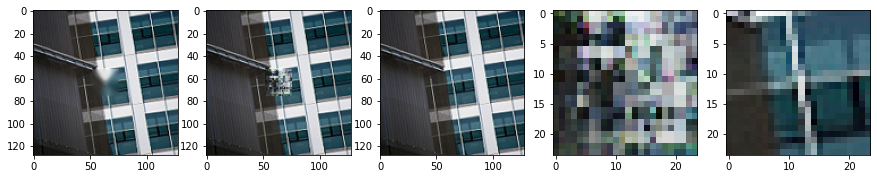

Baseline Acc: 0.51437   Model Acc: 0.26159   Original Image  Generated missing area  Label of missing area


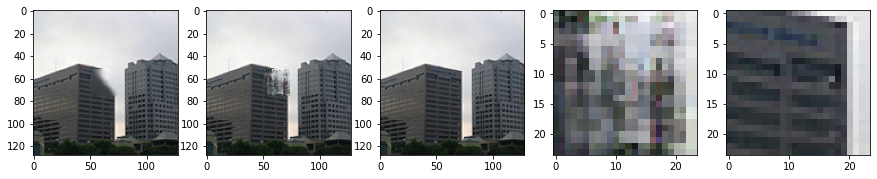

Baseline Acc: 0.34197   Model Acc: 0.41065   Original Image  Generated missing area  Label of missing area


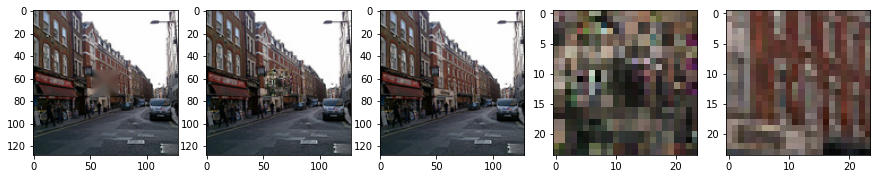

Baseline Acc: 0.7176   Model Acc: 0.56509   Original Image  Generated missing area  Label of missing area


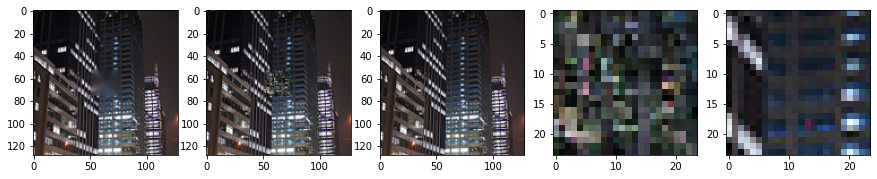

Baseline Acc: 0.68476   Model Acc: 0.55397   Original Image  Generated missing area  Label of missing area


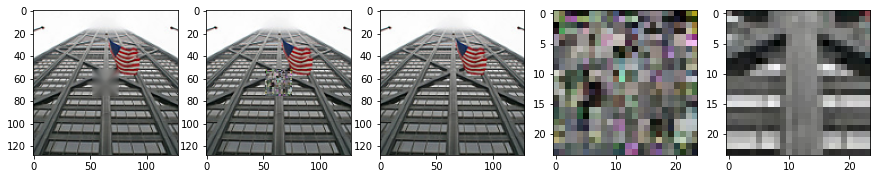

Baseline Acc: 0.56468   Model Acc: 0.33783   Original Image  Generated missing area  Label of missing area


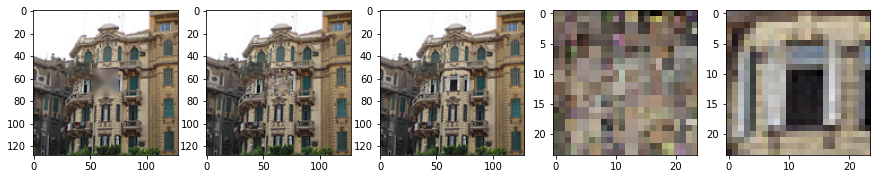

Baseline Acc: 0.45372   Model Acc: 0.38025   Original Image  Generated missing area  Label of missing area


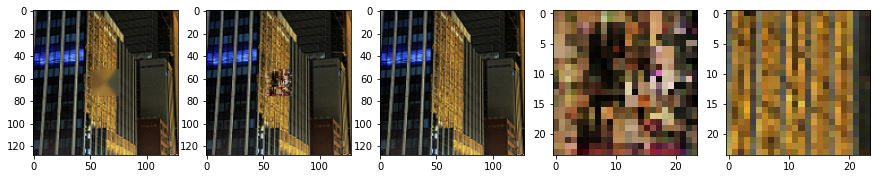

Baseline Acc: 0.6767   Model Acc: 0.42822   Original Image  Generated missing area  Label of missing area


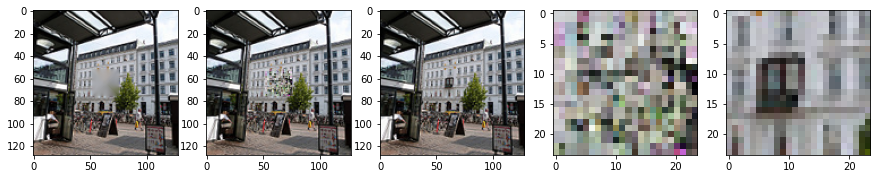

Baseline Acc: 0.57275   Model Acc: 0.40305   Original Image  Generated missing area  Label of missing area


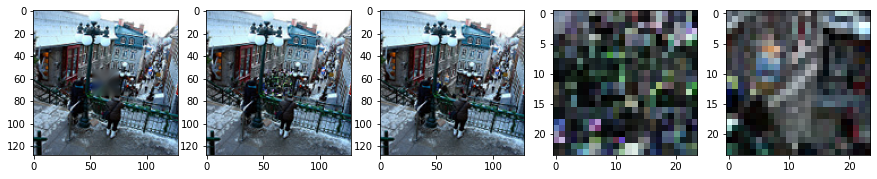

Baseline Acc: 0.59661   Model Acc: 0.4024   Original Image  Generated missing area  Label of missing area


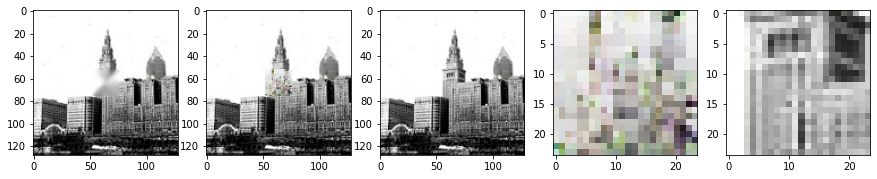

Baseline Acc: 0.48165   Model Acc: 0.39767   Original Image  Generated missing area  Label of missing area


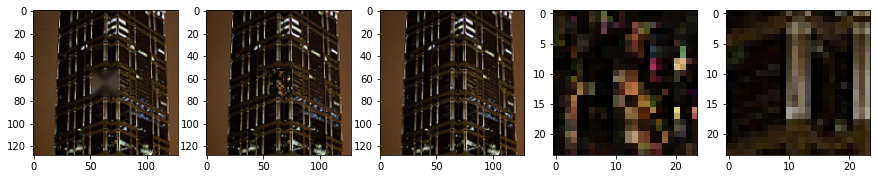

Baseline Acc: 0.62646   Model Acc: 0.64352   Original Image  Generated missing area  Label of missing area


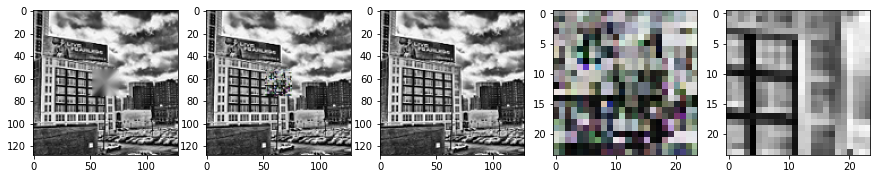

Baseline Acc: 0.39716   Model Acc: 0.11381   Original Image  Generated missing area  Label of missing area


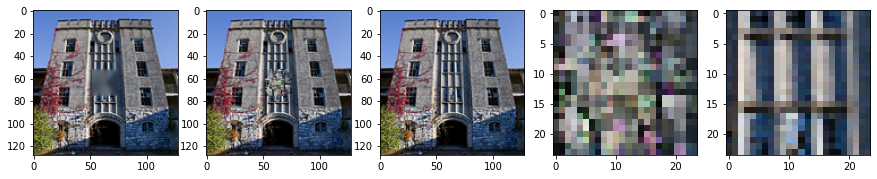

Baseline Acc: 0.44806   Model Acc: 0.38299   Original Image  Generated missing area  Label of missing area


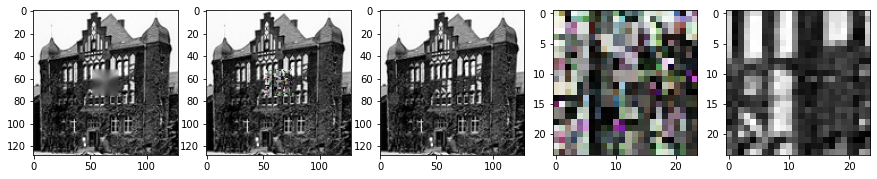

Baseline Acc: 0.3752   Model Acc: 0.15584   Original Image  Generated missing area  Label of missing area


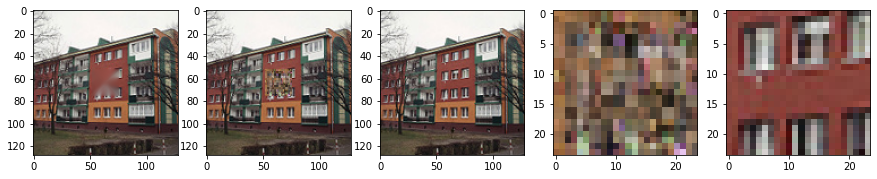

Baseline Acc: 0.65541   Model Acc: 0.5322   Original Image  Generated missing area  Label of missing area


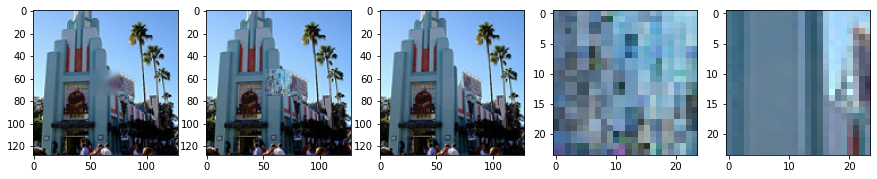

Baseline Acc: 0.74677   Model Acc: 0.62104   Original Image  Generated missing area  Label of missing area


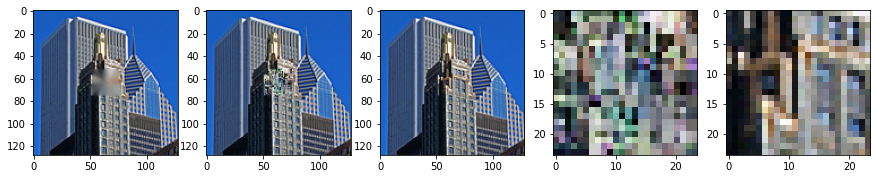

Baseline Acc: 0.45472   Model Acc: 0.27364   Original Image  Generated missing area  Label of missing area


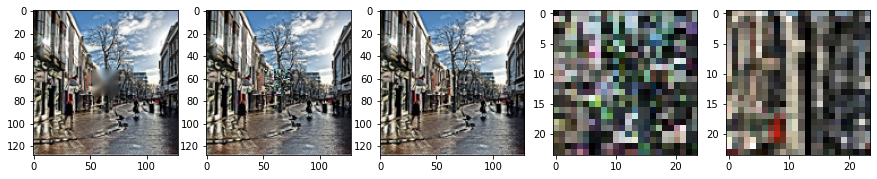

Baseline Acc: 0.41906   Model Acc: 0.24988   Original Image  Generated missing area  Label of missing area


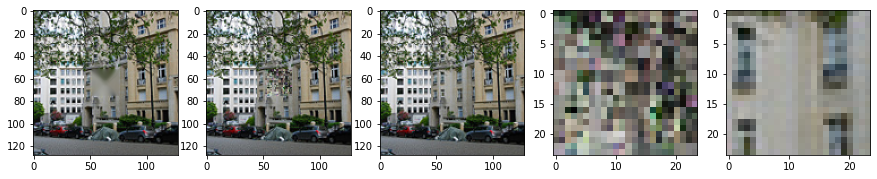

Baseline Acc: 0.62746   Model Acc: 0.38522   Original Image  Generated missing area  Label of missing area


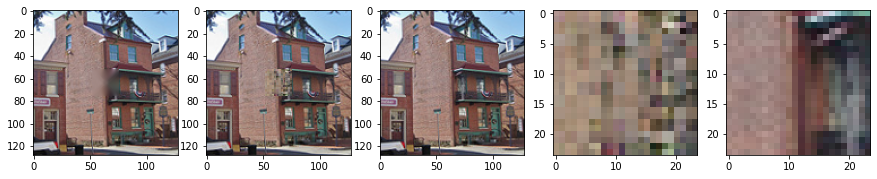

Baseline Acc: 0.79336   Model Acc: 0.60744   Original Image  Generated missing area  Label of missing area


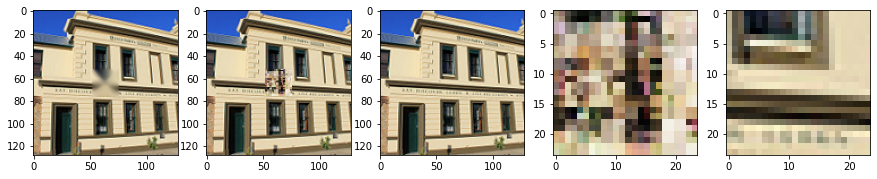

Baseline Acc: 0.48198   Model Acc: 0.26454   Original Image  Generated missing area  Label of missing area


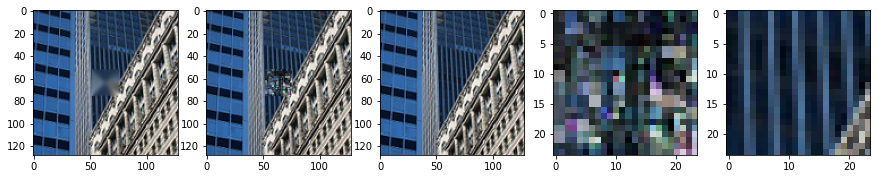

Baseline Acc: 0.50379   Model Acc: 0.4599   Original Image  Generated missing area  Label of missing area


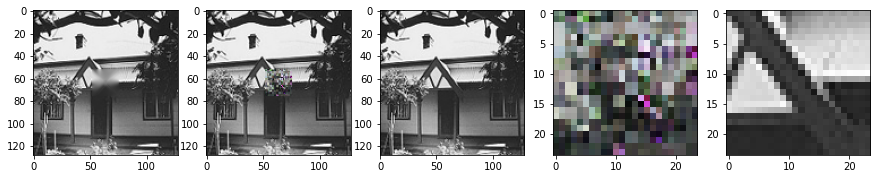

Baseline Acc: 0.49673   Model Acc: 0.3283   Original Image  Generated missing area  Label of missing area


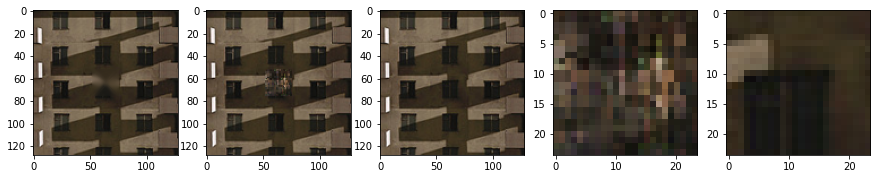

Baseline Acc: 0.84237   Model Acc: 0.71991   Original Image  Generated missing area  Label of missing area


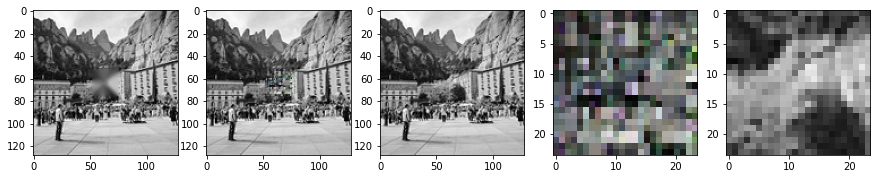

Baseline Acc: 0.56356   Model Acc: 0.30151   Original Image  Generated missing area  Label of missing area


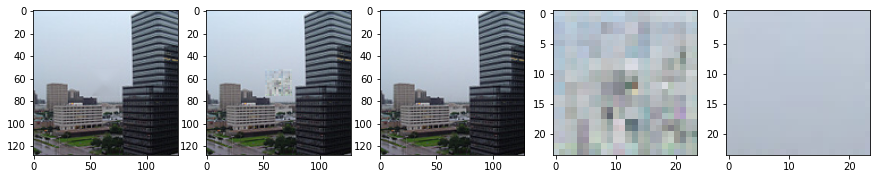

Baseline Acc: 0.96401   Model Acc: 0.81867   Original Image  Generated missing area  Label of missing area


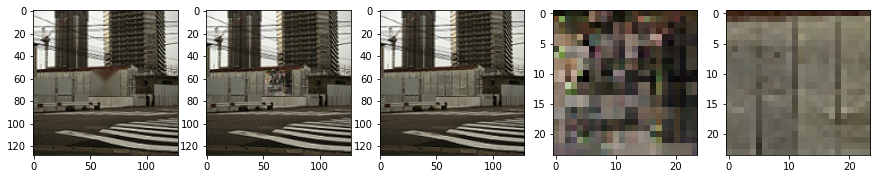

Baseline Acc: 0.72245   Model Acc: 0.50271   Original Image  Generated missing area  Label of missing area


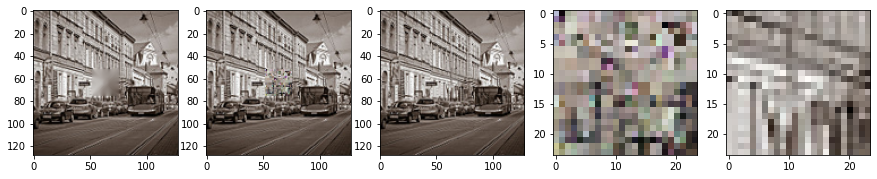

Baseline Acc: 0.65179   Model Acc: 0.42326   Original Image  Generated missing area  Label of missing area


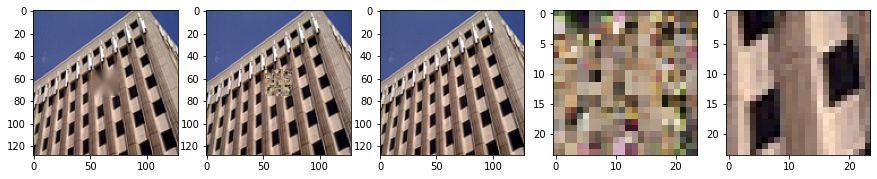

Baseline Acc: 0.42872   Model Acc: 0.33505   Original Image  Generated missing area  Label of missing area


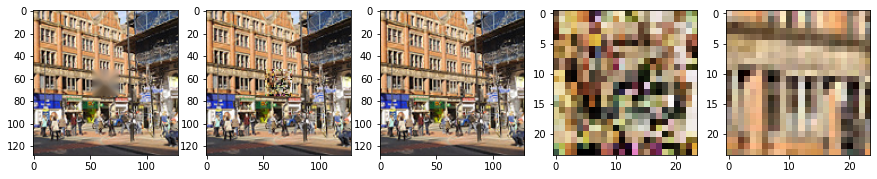

Baseline Acc: 0.43729   Model Acc: 0.24825   Original Image  Generated missing area  Label of missing area


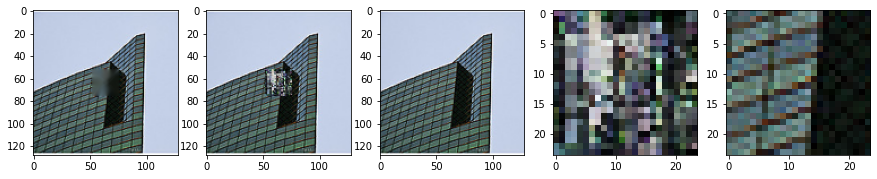

Baseline Acc: 0.71598   Model Acc: 0.29876   Original Image  Generated missing area  Label of missing area


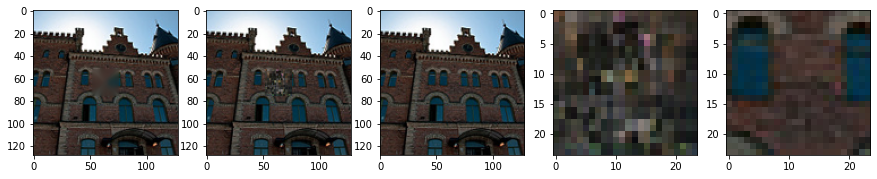

Baseline Acc: 0.82544   Model Acc: 0.72486   Original Image  Generated missing area  Label of missing area


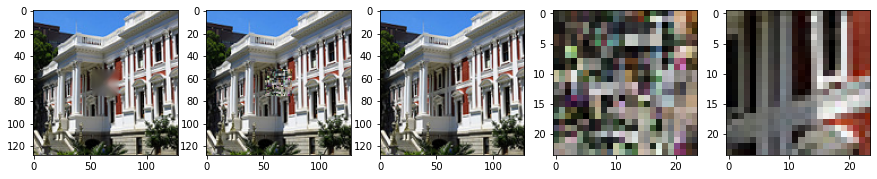

Baseline Acc: 0.52289   Model Acc: 0.26251   Original Image  Generated missing area  Label of missing area


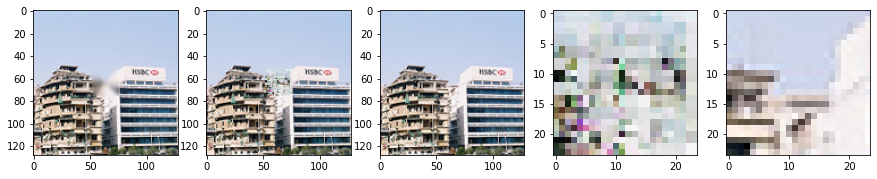

Baseline Acc: 0.6812   Model Acc: 0.54439   Original Image  Generated missing area  Label of missing area


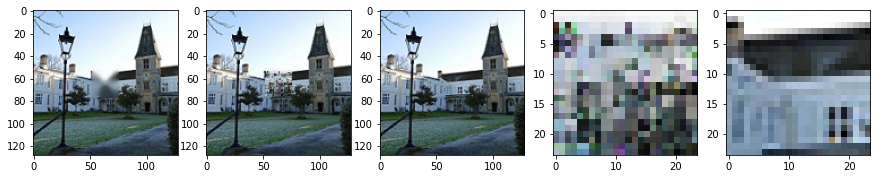

Baseline Acc: 0.31314   Model Acc: 0.18443   Original Image  Generated missing area  Label of missing area


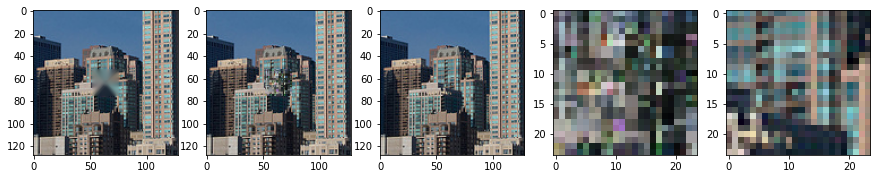

Baseline Acc: 0.61107   Model Acc: 0.37482   Original Image  Generated missing area  Label of missing area


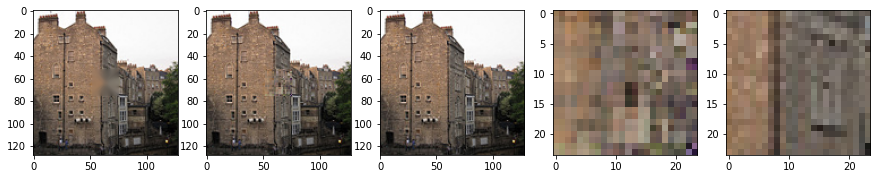

Baseline Acc: 0.83262   Model Acc: 0.73812   Original Image  Generated missing area  Label of missing area


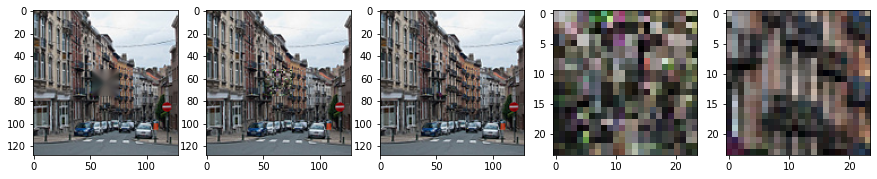

Baseline Acc: 0.55335   Model Acc: 0.42282   Original Image  Generated missing area  Label of missing area


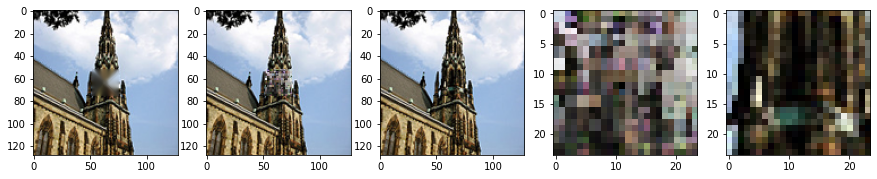

Baseline Acc: 0.21609   Model Acc: 0.16893   Original Image  Generated missing area  Label of missing area


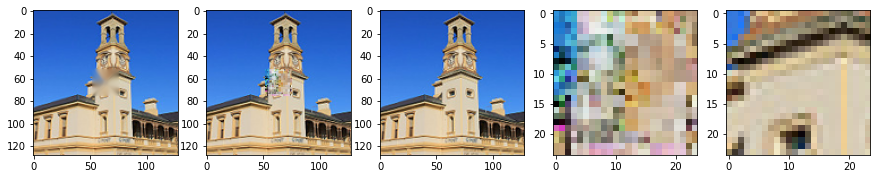

Baseline Acc: 0.60216   Model Acc: 0.41636   Original Image  Generated missing area  Label of missing area


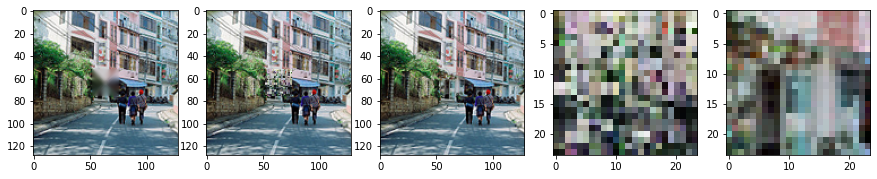

Baseline Acc: 0.46191   Model Acc: 0.27451   Original Image  Generated missing area  Label of missing area


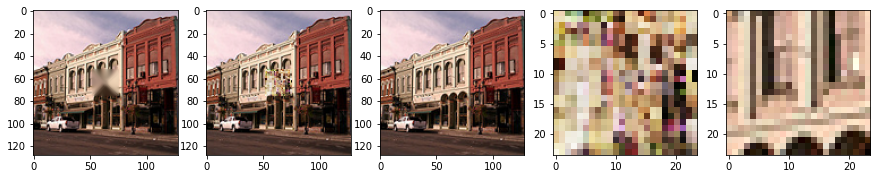

Baseline Acc: 0.29182   Model Acc: 0.23682   Original Image  Generated missing area  Label of missing area


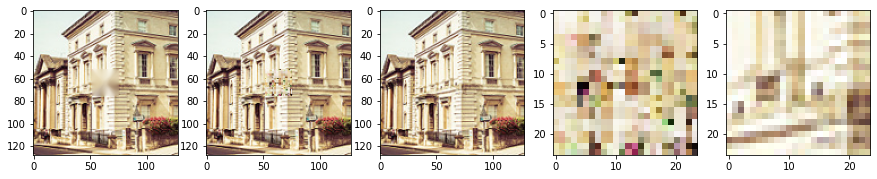

Baseline Acc: 0.63495   Model Acc: 0.49542   Original Image  Generated missing area  Label of missing area


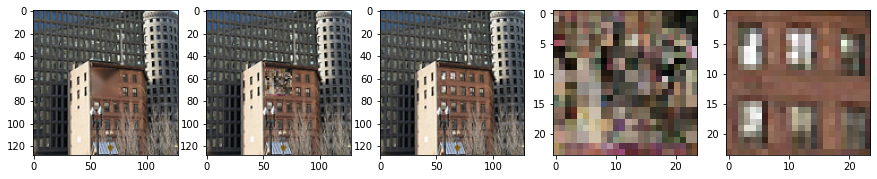

Baseline Acc: 0.64722   Model Acc: 0.49037   Original Image  Generated missing area  Label of missing area


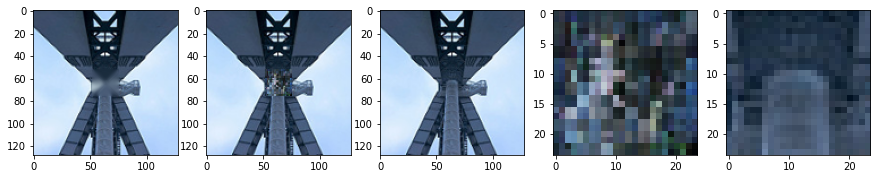

Baseline Acc: 0.69267   Model Acc: 0.63629   Original Image  Generated missing area  Label of missing area


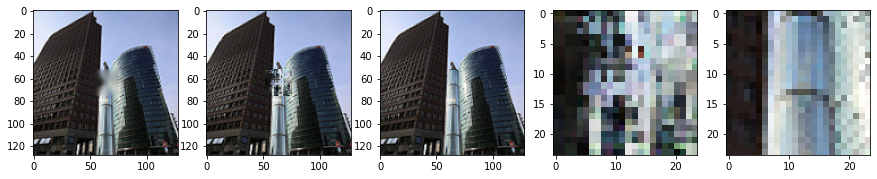

Baseline Acc: 0.58914   Model Acc: 0.30021   Original Image  Generated missing area  Label of missing area


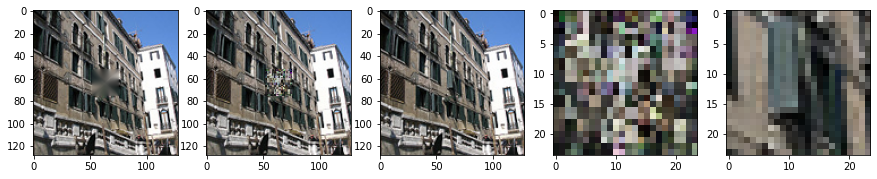

Baseline Acc: 0.49444   Model Acc: 0.32501   Original Image  Generated missing area  Label of missing area


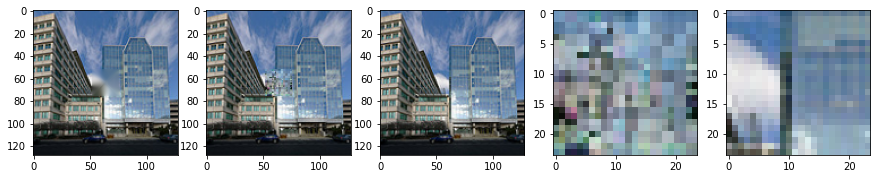

Baseline Acc: 0.66205   Model Acc: 0.52346   Original Image  Generated missing area  Label of missing area


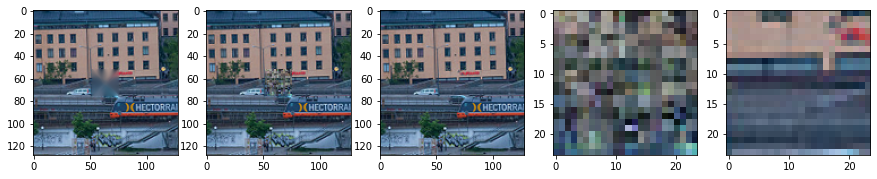

Baseline Acc: 0.70397   Model Acc: 0.56268   Original Image  Generated missing area  Label of missing area


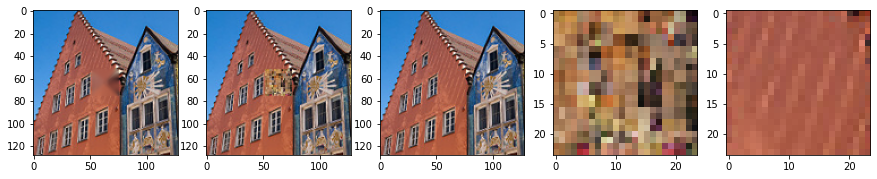

Baseline Acc: 0.82849   Model Acc: 0.61271   Original Image  Generated missing area  Label of missing area


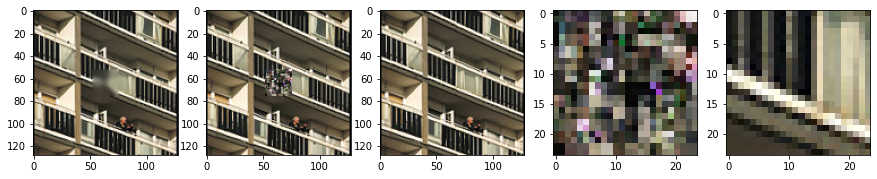

Baseline Acc: 0.53223   Model Acc: 0.21127   Original Image  Generated missing area  Label of missing area


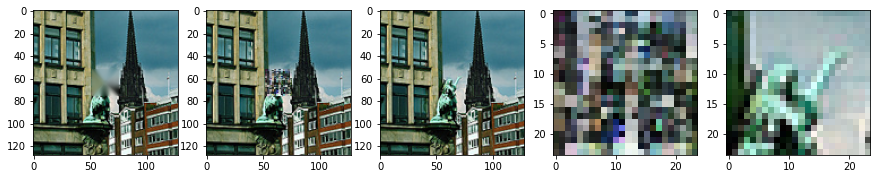

Baseline Acc: 0.35292   Model Acc: 0.0585   Original Image  Generated missing area  Label of missing area


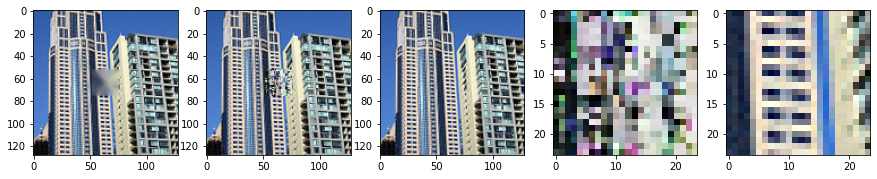

Baseline Acc: 0.36528   Model Acc: 0.20373   Original Image  Generated missing area  Label of missing area


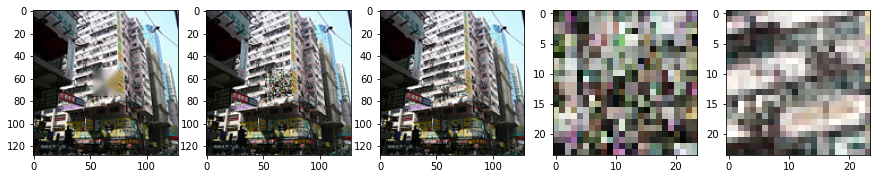

Baseline Acc: 0.37075   Model Acc: 0.17223   Original Image  Generated missing area  Label of missing area


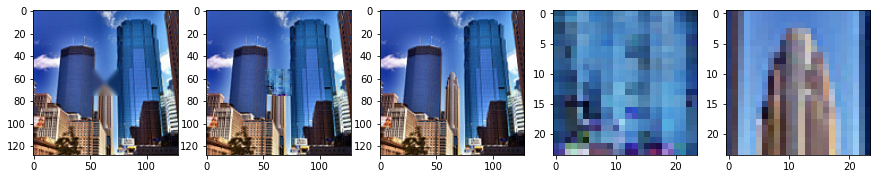

Baseline Acc: 0.45123   Model Acc: 0.49483   Original Image  Generated missing area  Label of missing area


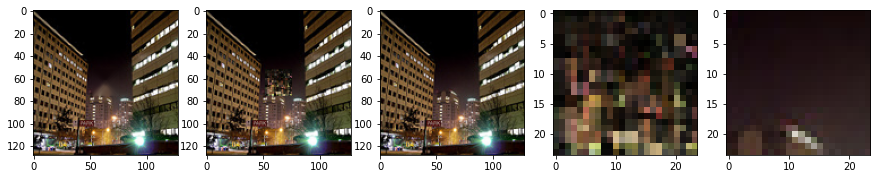

Baseline Acc: 0.88499   Model Acc: 0.70168   Original Image  Generated missing area  Label of missing area


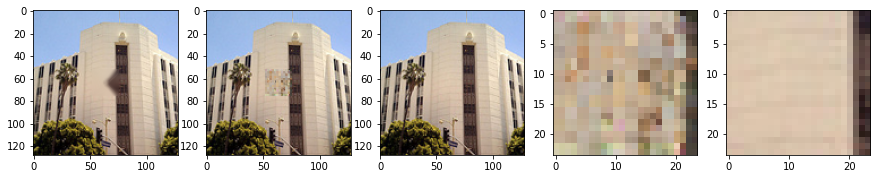

Baseline Acc: 0.70396   Model Acc: 0.65706   Original Image  Generated missing area  Label of missing area


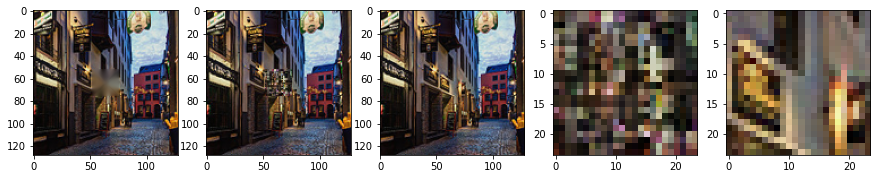

Baseline Acc: 0.54561   Model Acc: 0.29166   Original Image  Generated missing area  Label of missing area


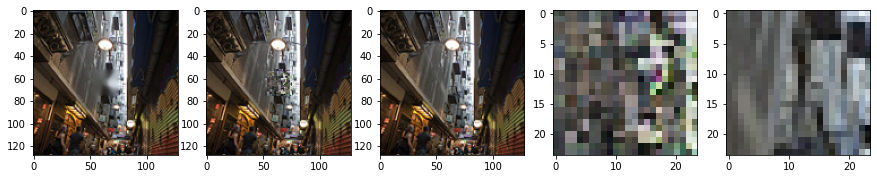

Baseline Acc: 0.5965   Model Acc: 0.44178   Original Image  Generated missing area  Label of missing area


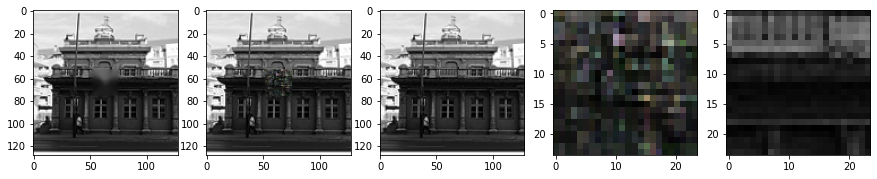

Baseline Acc: 0.77175   Model Acc: 0.66543   Original Image  Generated missing area  Label of missing area


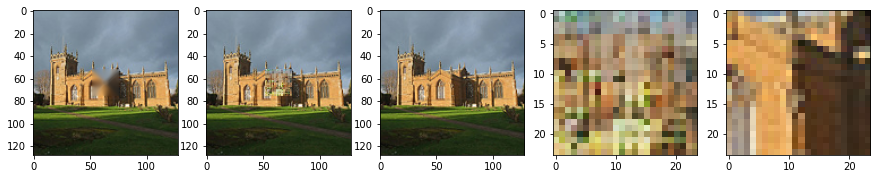

Baseline Acc: 0.64991   Model Acc: 0.33806   Original Image  Generated missing area  Label of missing area


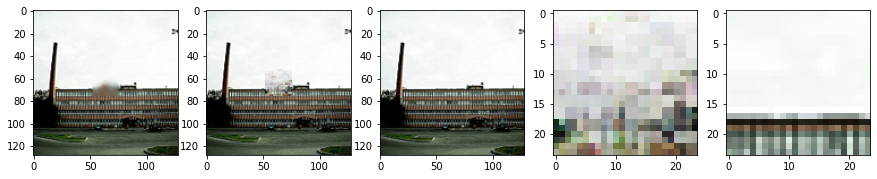

Baseline Acc: 0.66516   Model Acc: 0.54507   Original Image  Generated missing area  Label of missing area


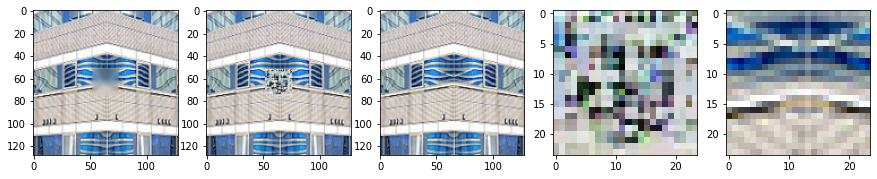

Baseline Acc: 0.60716   Model Acc: 0.22427   Original Image  Generated missing area  Label of missing area


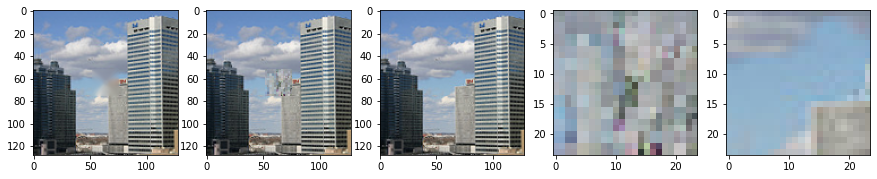

Baseline Acc: 0.83841   Model Acc: 0.72995   Original Image  Generated missing area  Label of missing area


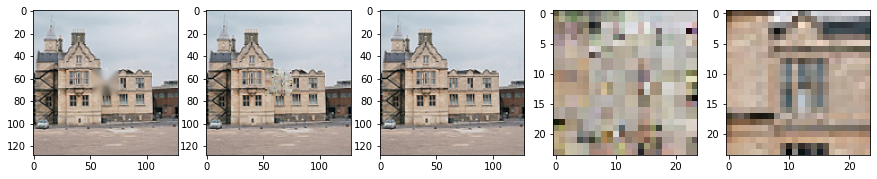

Baseline Acc: 0.62013   Model Acc: 0.53713   Original Image  Generated missing area  Label of missing area


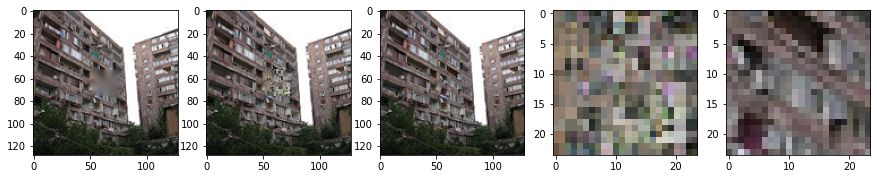

Baseline Acc: 0.67471   Model Acc: 0.50081   Original Image  Generated missing area  Label of missing area


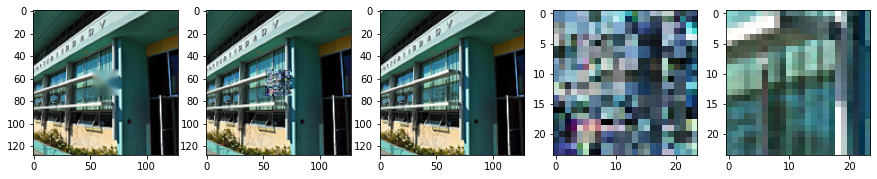

Baseline Acc: 0.48128   Model Acc: 0.33218   Original Image  Generated missing area  Label of missing area


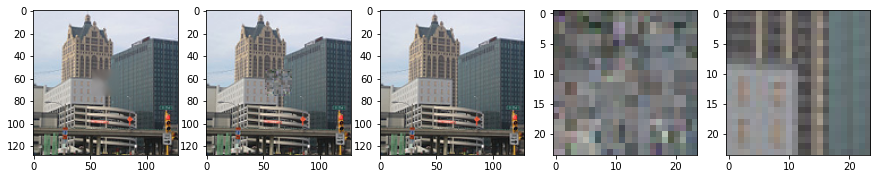

Baseline Acc: 0.85489   Model Acc: 0.74112   Original Image  Generated missing area  Label of missing area


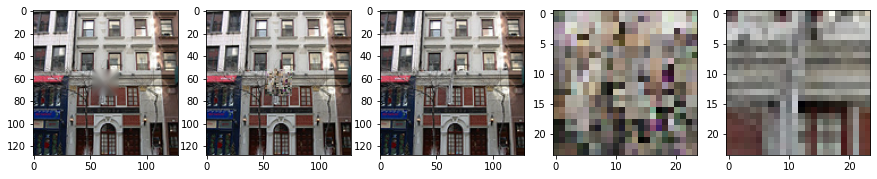

Baseline Acc: 0.67536   Model Acc: 0.46777   Original Image  Generated missing area  Label of missing area


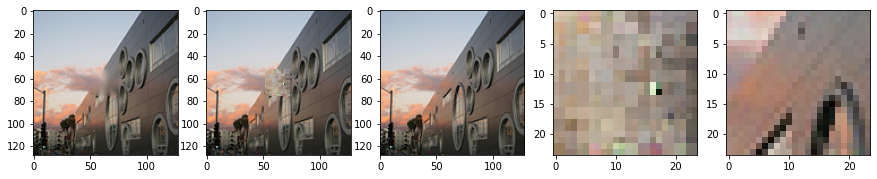

Baseline Acc: 0.77684   Model Acc: 0.62535   Original Image  Generated missing area  Label of missing area


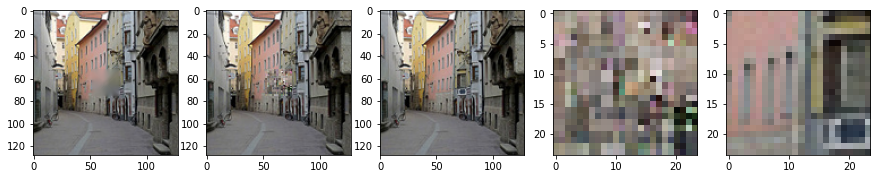

Baseline Acc: 0.73329   Model Acc: 0.52323   Original Image  Generated missing area  Label of missing area


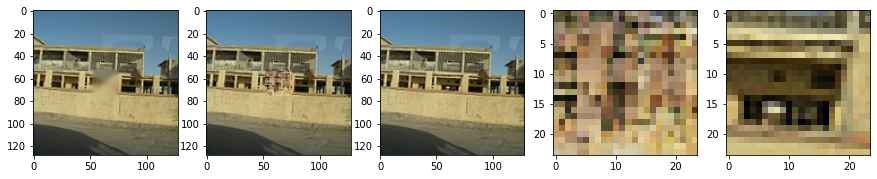

Baseline Acc: 0.42958   Model Acc: 0.37334   Original Image  Generated missing area  Label of missing area


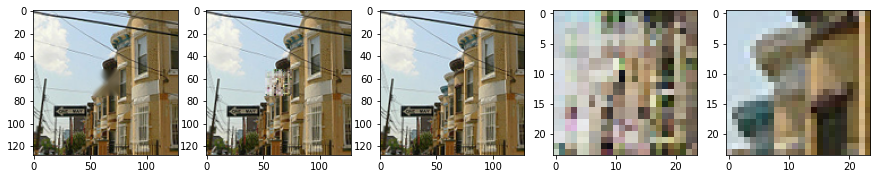

Baseline Acc: 0.58431   Model Acc: 0.38447   Original Image  Generated missing area  Label of missing area


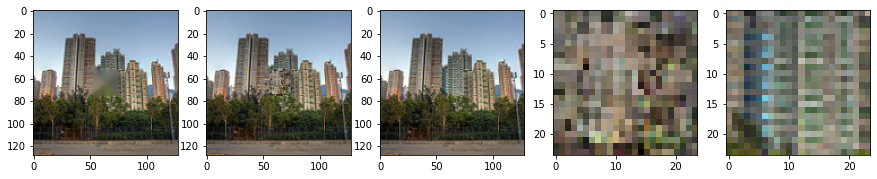

Baseline Acc: 0.65224   Model Acc: 0.55113   Original Image  Generated missing area  Label of missing area


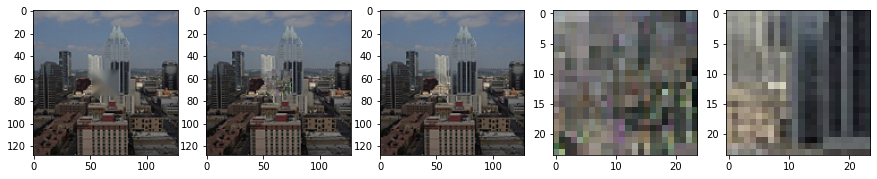

Baseline Acc: 0.64339   Model Acc: 0.63698   Original Image  Generated missing area  Label of missing area


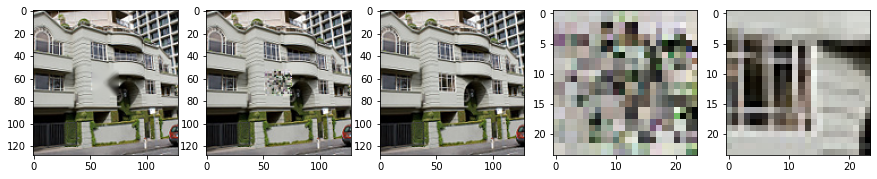

Baseline Acc: 0.25881   Model Acc: 0.32691   Original Image  Generated missing area  Label of missing area


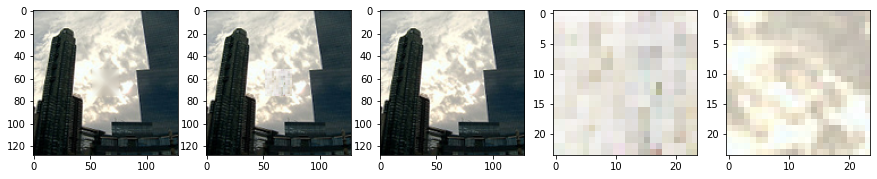

Baseline Acc: 0.78937   Model Acc: 0.75554   Original Image  Generated missing area  Label of missing area


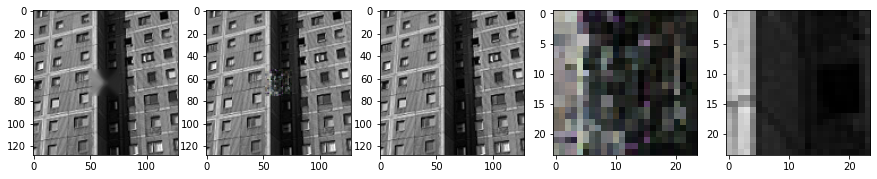

Baseline Acc: 0.66881   Model Acc: 0.61952   Original Image  Generated missing area  Label of missing area


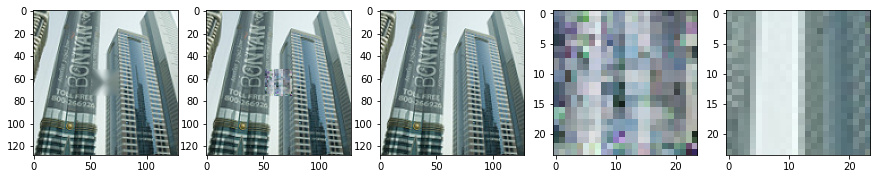

Baseline Acc: 0.67427   Model Acc: 0.47893   Original Image  Generated missing area  Label of missing area


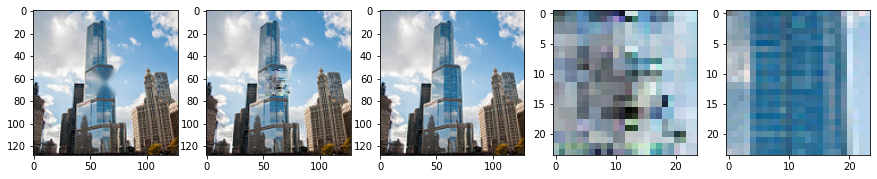

Baseline Acc: 0.68512   Model Acc: 0.47846   Original Image  Generated missing area  Label of missing area


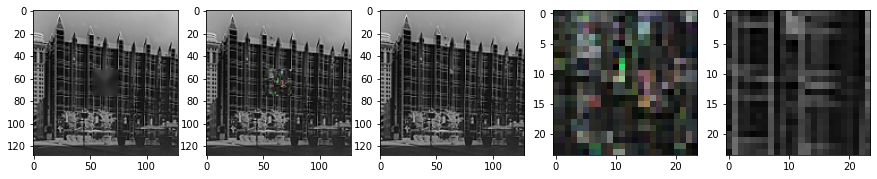

Baseline Acc: 0.73335   Model Acc: 0.59635   Original Image  Generated missing area  Label of missing area


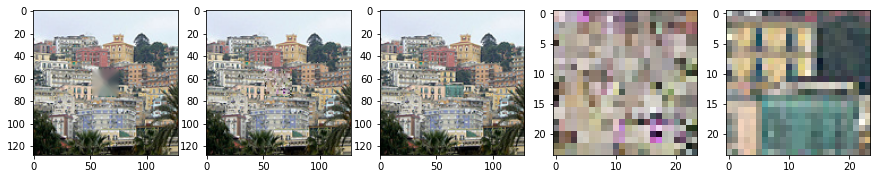

Baseline Acc: 0.63511   Model Acc: 0.36542   Original Image  Generated missing area  Label of missing area


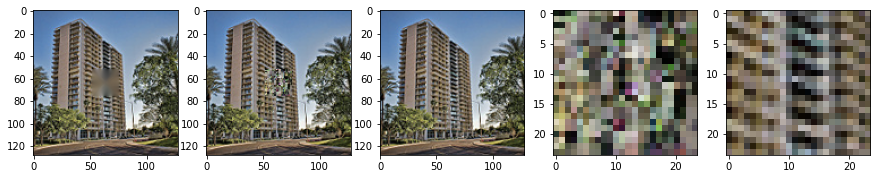

Baseline Acc: 0.579   Model Acc: 0.34776   Original Image  Generated missing area  Label of missing area


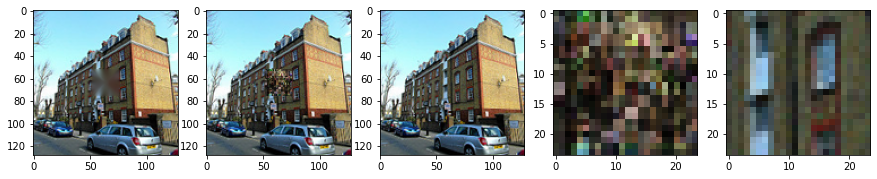

Baseline Acc: 0.71329   Model Acc: 0.48682   Original Image  Generated missing area  Label of missing area


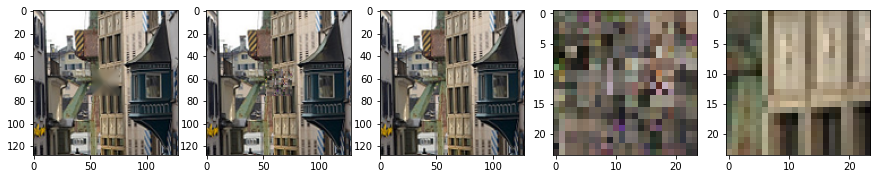

Baseline Acc: 0.62464   Model Acc: 0.49747   Original Image  Generated missing area  Label of missing area


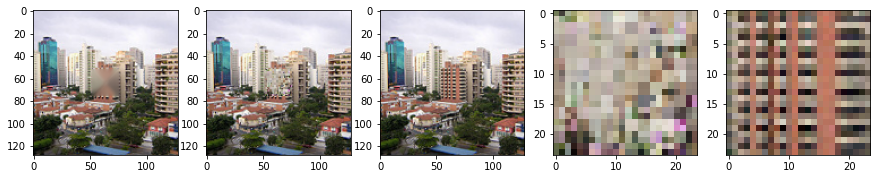

Baseline Acc: 0.51103   Model Acc: 0.32594   Original Image  Generated missing area  Label of missing area


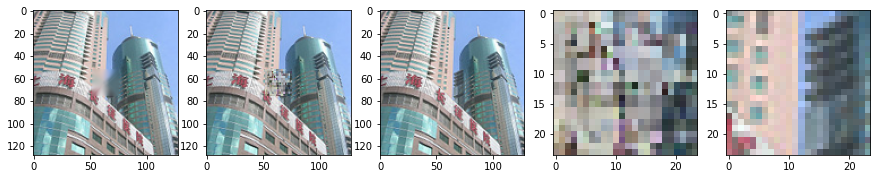

Baseline Acc: 0.7207   Model Acc: 0.4472   Original Image  Generated missing area  Label of missing area


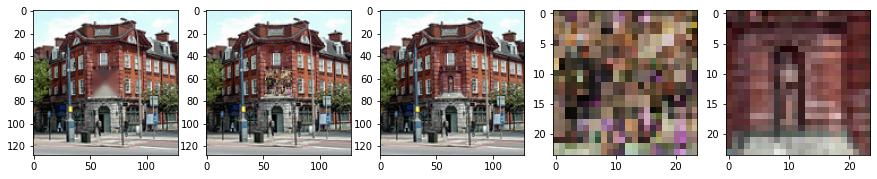

Baseline Acc: 0.65511   Model Acc: 0.42528   Original Image  Generated missing area  Label of missing area


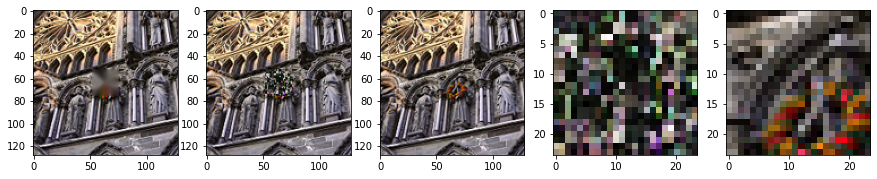

Baseline Acc: 0.4821   Model Acc: 0.2932   Original Image  Generated missing area  Label of missing area


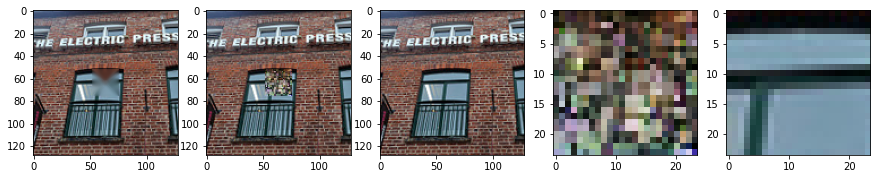

Baseline Acc: 0.53123   Model Acc: 0.25944   Original Image  Generated missing area  Label of missing area


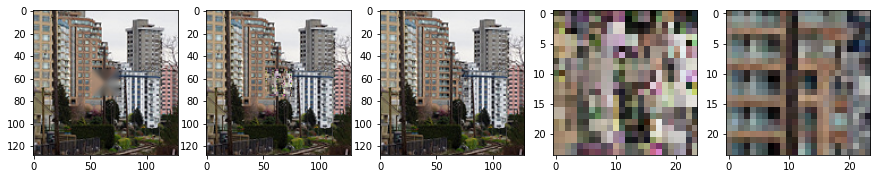

Baseline Acc: 0.60511   Model Acc: 0.3376   Original Image  Generated missing area  Label of missing area


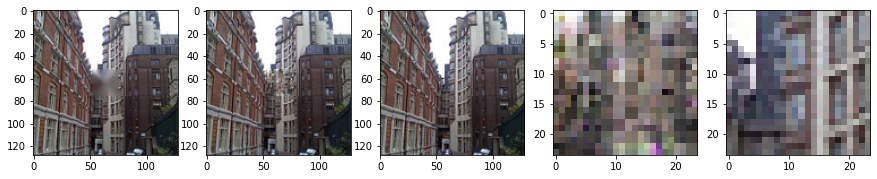

Baseline Acc: 0.60427   Model Acc: 0.50969   Original Image  Generated missing area  Label of missing area


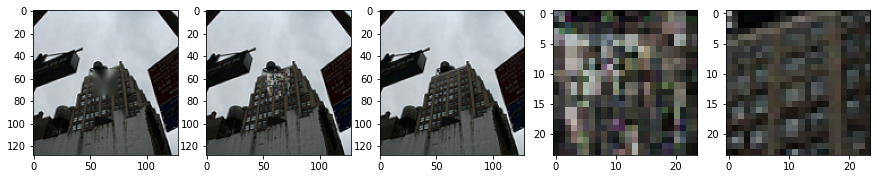

Baseline Acc: 0.73452   Model Acc: 0.55644   Original Image  Generated missing area  Label of missing area


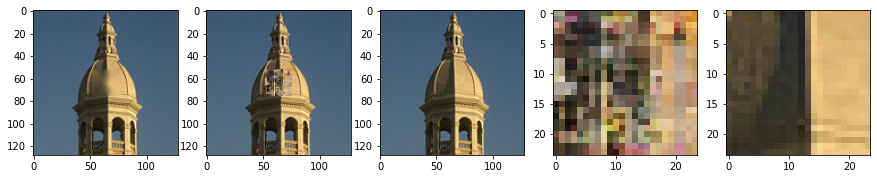

Baseline Acc: 0.79748   Model Acc: 0.48695   Original Image  Generated missing area  Label of missing area


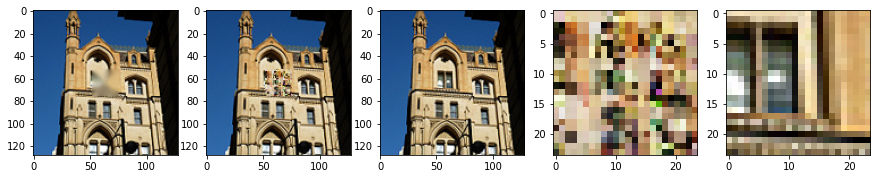

Baseline Acc: 0.387   Model Acc: 0.2065   Original Image  Generated missing area  Label of missing area


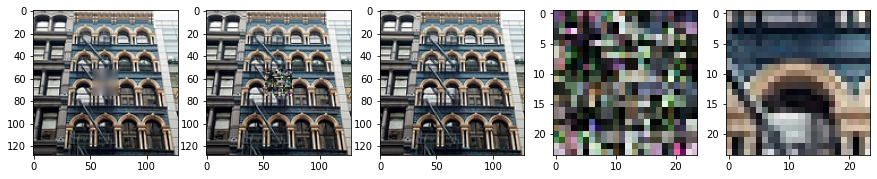

Baseline Acc: 0.43355   Model Acc: 0.19781   Original Image  Generated missing area  Label of missing area


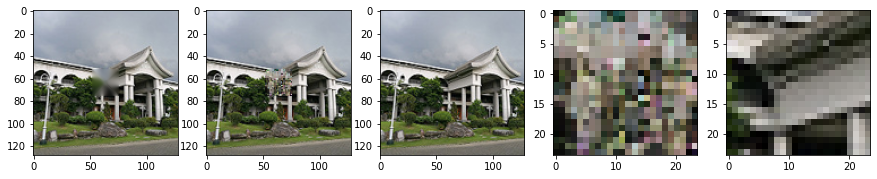

Baseline Acc: 0.42461   Model Acc: 0.25881   Original Image  Generated missing area  Label of missing area


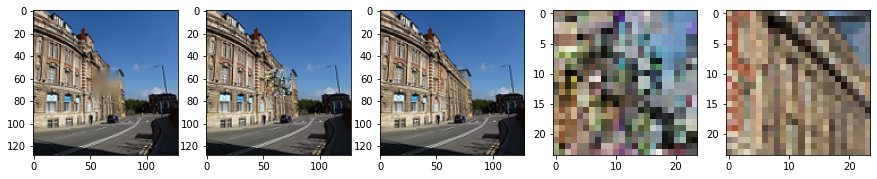

Baseline Acc: 0.61668   Model Acc: 0.3747   Original Image  Generated missing area  Label of missing area


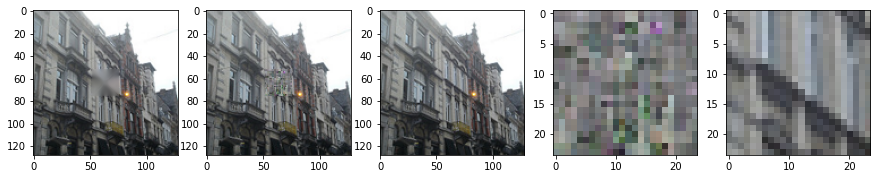

Baseline Acc: 0.72635   Model Acc: 0.62418   Original Image  Generated missing area  Label of missing area


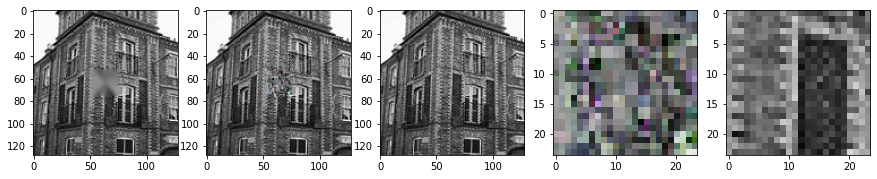

Baseline Acc: 0.55858   Model Acc: 0.47013   Original Image  Generated missing area  Label of missing area


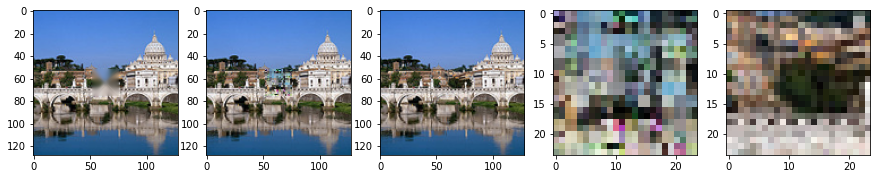

Baseline Acc: 0.41234   Model Acc: 0.29462   Original Image  Generated missing area  Label of missing area


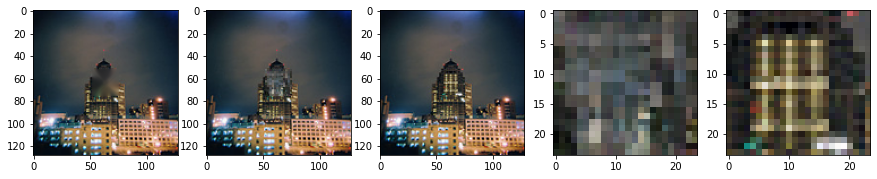

Baseline Acc: 0.59239   Model Acc: 0.56105   Original Image  Generated missing area  Label of missing area


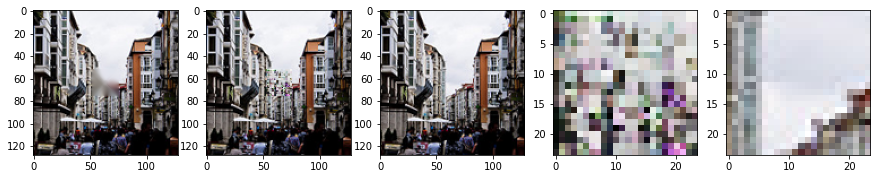

Baseline Acc: 0.5575   Model Acc: 0.33706   Original Image  Generated missing area  Label of missing area


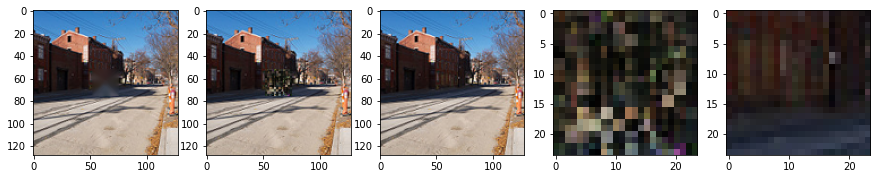

Baseline Acc: 0.82998   Model Acc: 0.67452   Original Image  Generated missing area  Label of missing area


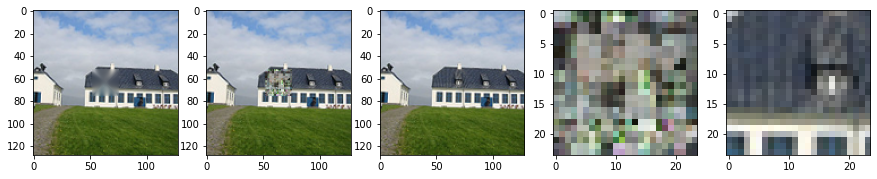

Baseline Acc: 0.61216   Model Acc: 0.36526   Original Image  Generated missing area  Label of missing area


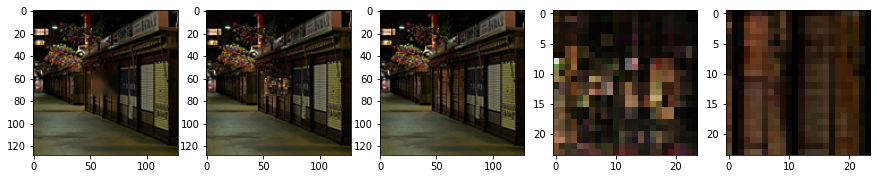

Baseline Acc: 0.77173   Model Acc: 0.67094   Original Image  Generated missing area  Label of missing area


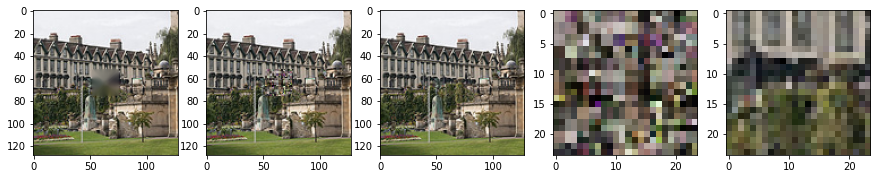

Baseline Acc: 0.64116   Model Acc: 0.38252   Original Image  Generated missing area  Label of missing area


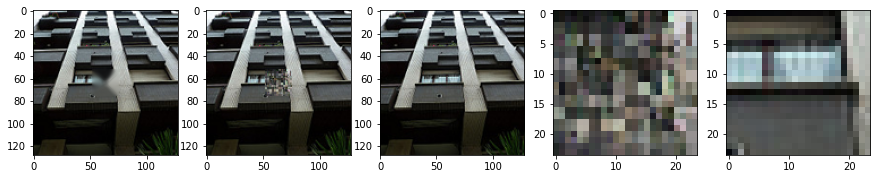

Baseline Acc: 0.5551   Model Acc: 0.43656   Original Image  Generated missing area  Label of missing area


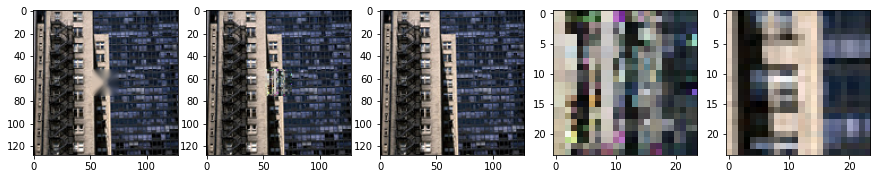

Baseline Acc: 0.34014   Model Acc: 0.24792   Original Image  Generated missing area  Label of missing area


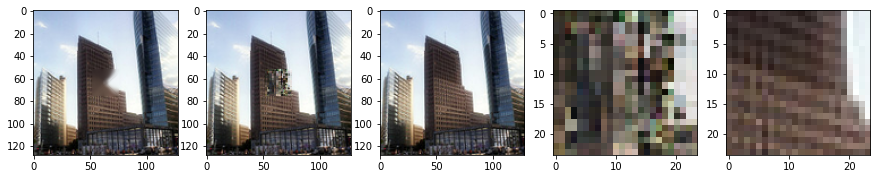

Baseline Acc: 0.64169   Model Acc: 0.59604   Original Image  Generated missing area  Label of missing area


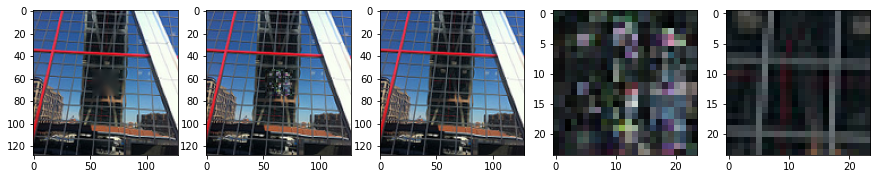

Baseline Acc: 0.75415   Model Acc: 0.57121   Original Image  Generated missing area  Label of missing area


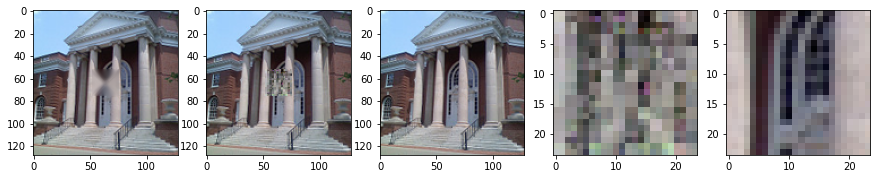

Baseline Acc: 0.58117   Model Acc: 0.51578   Original Image  Generated missing area  Label of missing area


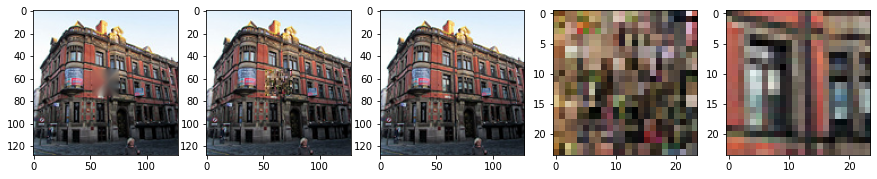

Baseline Acc: 0.56464   Model Acc: 0.44697   Original Image  Generated missing area  Label of missing area


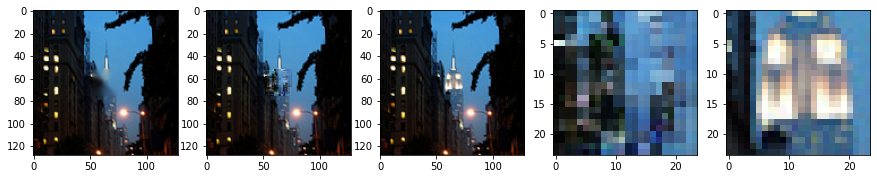

Baseline Acc: 0.47427   Model Acc: 0.32301   Original Image  Generated missing area  Label of missing area


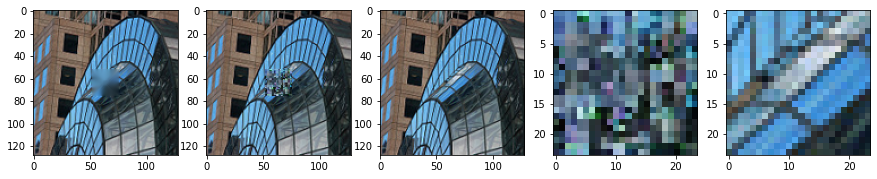

Baseline Acc: 0.52955   Model Acc: 0.31287   Original Image  Generated missing area  Label of missing area


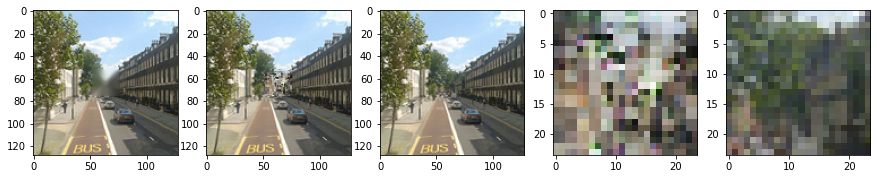

Baseline Acc: 0.60133   Model Acc: 0.39724   Original Image  Generated missing area  Label of missing area


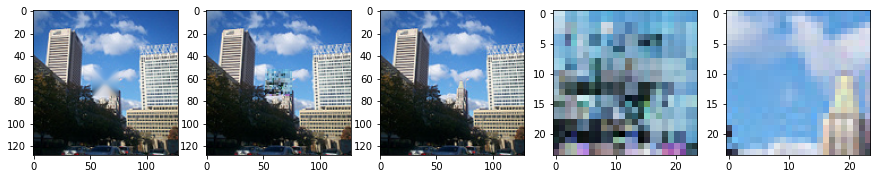

Baseline Acc: 0.72586   Model Acc: 0.3888   Original Image  Generated missing area  Label of missing area


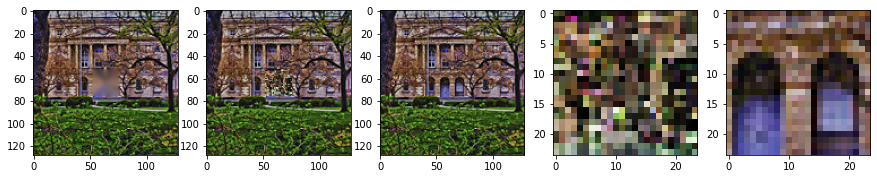

Baseline Acc: 0.50372   Model Acc: 0.33963   Original Image  Generated missing area  Label of missing area


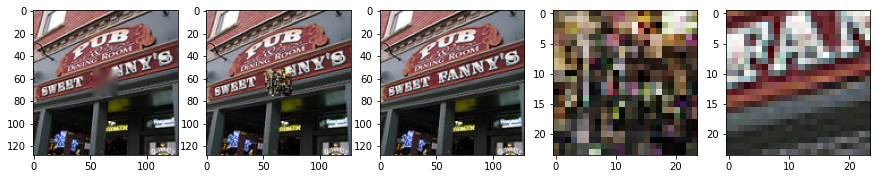

Baseline Acc: 0.47601   Model Acc: 0.35403   Original Image  Generated missing area  Label of missing area


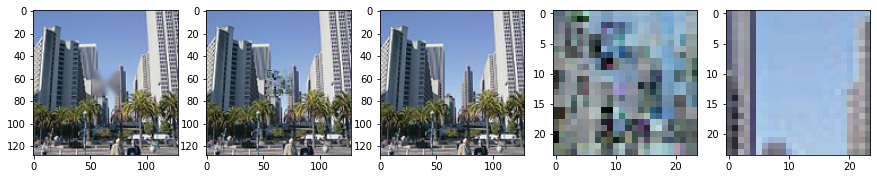

Baseline Acc: 0.60189   Model Acc: 0.41953   Original Image  Generated missing area  Label of missing area


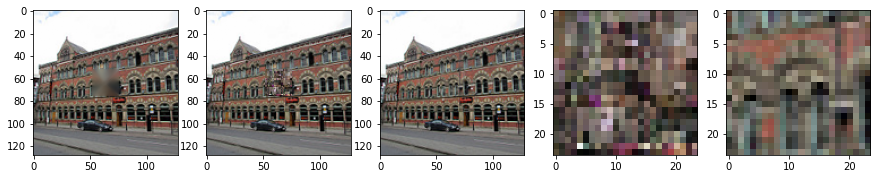

Baseline Acc: 0.68963   Model Acc: 0.56419   Original Image  Generated missing area  Label of missing area


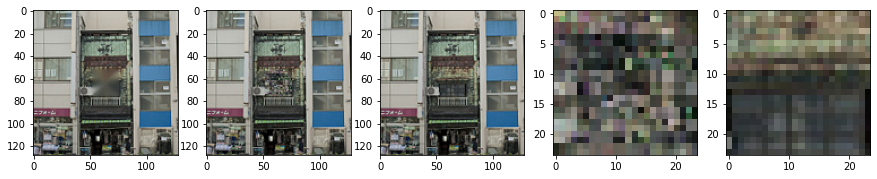

Baseline Acc: 0.68287   Model Acc: 0.50564   Original Image  Generated missing area  Label of missing area


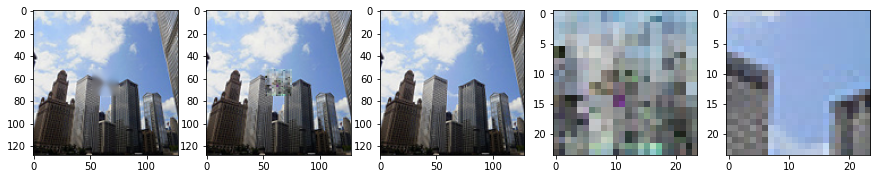

Baseline Acc: 0.79916   Model Acc: 0.55105   Original Image  Generated missing area  Label of missing area


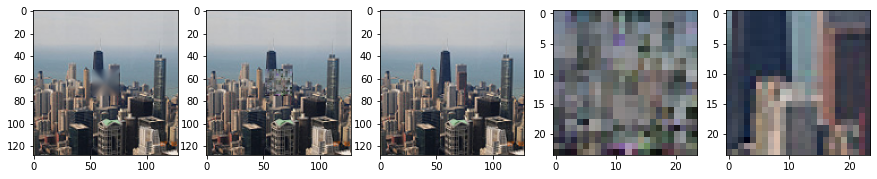

Baseline Acc: 0.62706   Model Acc: 0.48305   Original Image  Generated missing area  Label of missing area


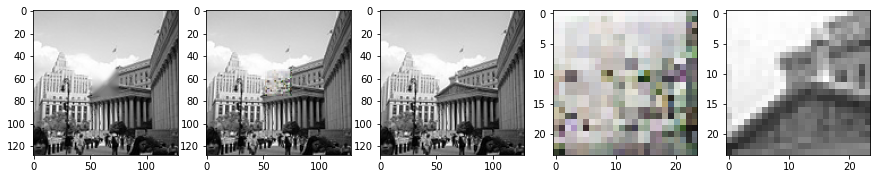

Baseline Acc: 0.65235   Model Acc: 0.39294   Original Image  Generated missing area  Label of missing area


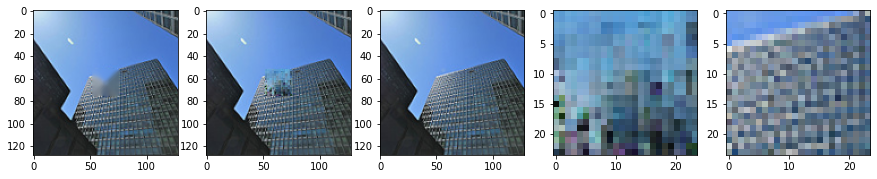

Baseline Acc: 0.72708   Model Acc: 0.59661   Original Image  Generated missing area  Label of missing area


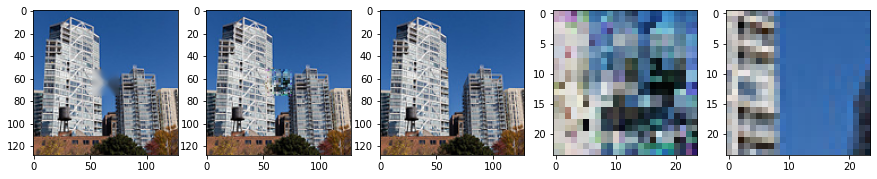

Baseline Acc: 0.6967   Model Acc: 0.42749   Original Image  Generated missing area  Label of missing area


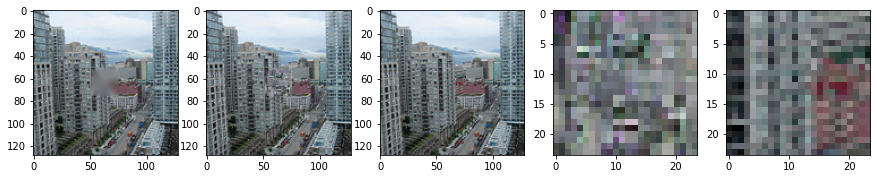

Baseline Acc: 0.67297   Model Acc: 0.5675   Original Image  Generated missing area  Label of missing area


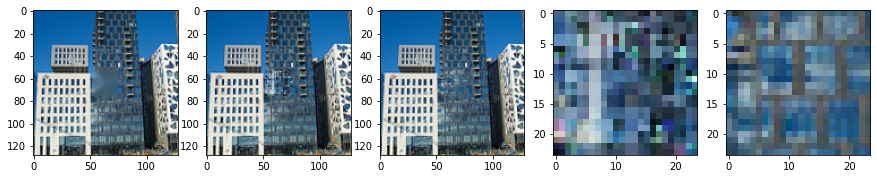

Baseline Acc: 0.71153   Model Acc: 0.51306   Original Image  Generated missing area  Label of missing area


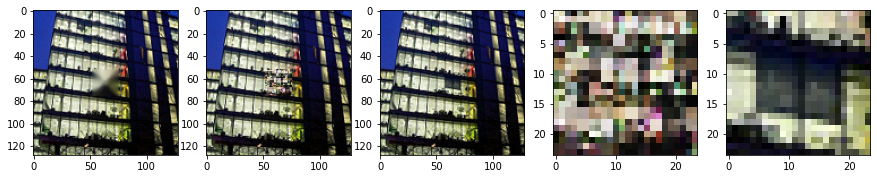

Baseline Acc: 0.1785   Model Acc: 0.12318   Original Image  Generated missing area  Label of missing area


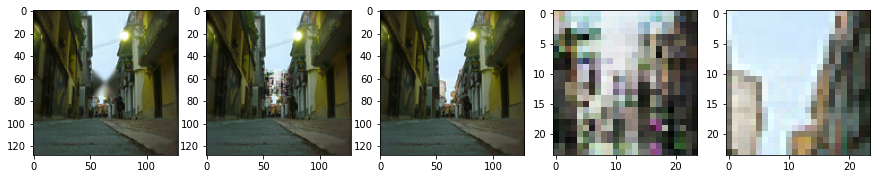

Baseline Acc: 0.31258   Model Acc: 0.284   Original Image  Generated missing area  Label of missing area


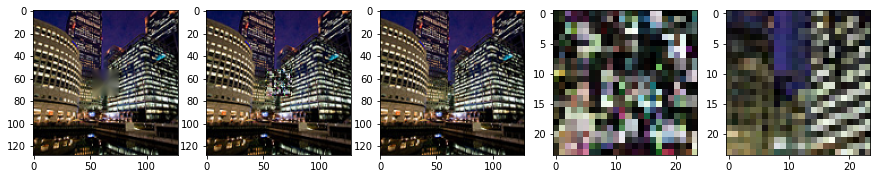

Baseline Acc: 0.55438   Model Acc: 0.18752   Original Image  Generated missing area  Label of missing area


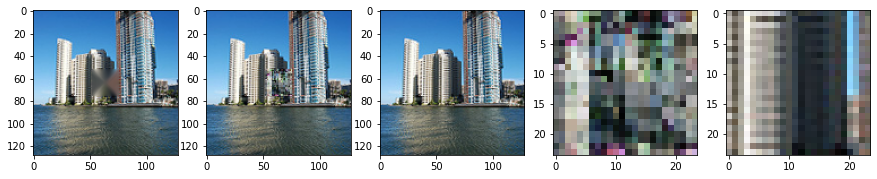

Baseline Acc: 0.49752   Model Acc: 0.33853   Original Image  Generated missing area  Label of missing area


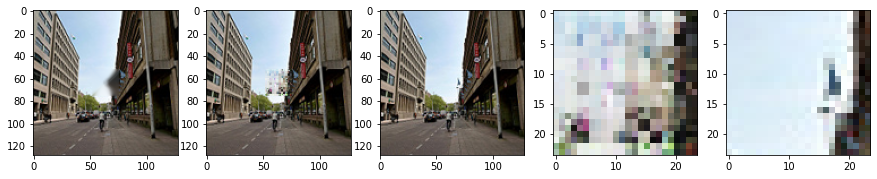

Baseline Acc: 0.60295   Model Acc: 0.4728   Original Image  Generated missing area  Label of missing area


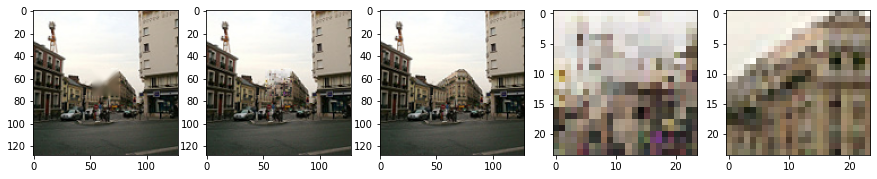

Baseline Acc: 0.58306   Model Acc: 0.45796   Original Image  Generated missing area  Label of missing area


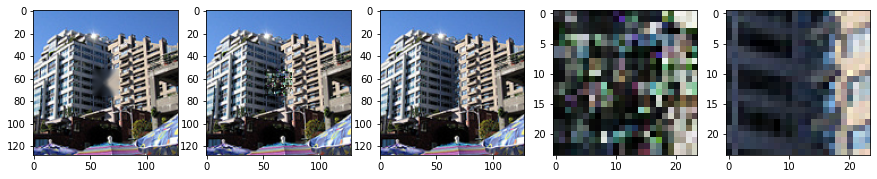

Baseline Acc: 0.66264   Model Acc: 0.42508   Original Image  Generated missing area  Label of missing area


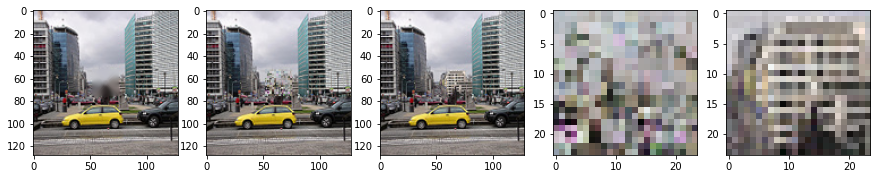

Baseline Acc: 0.57437   Model Acc: 0.45578   Original Image  Generated missing area  Label of missing area


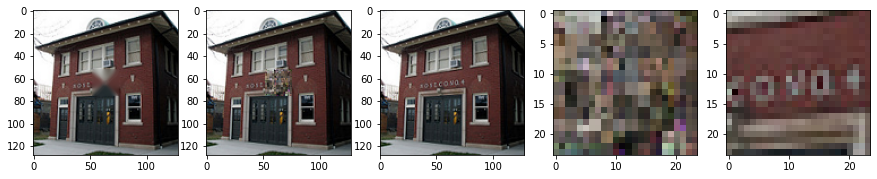

Baseline Acc: 0.60012   Model Acc: 0.60053   Original Image  Generated missing area  Label of missing area


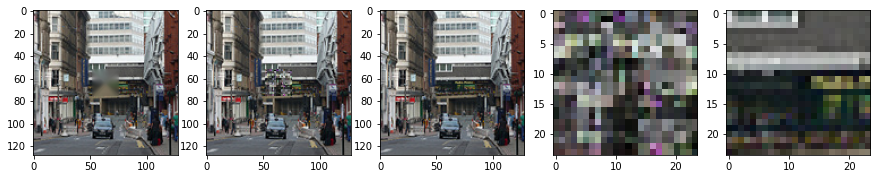

Baseline Acc: 0.52874   Model Acc: 0.33661   Original Image  Generated missing area  Label of missing area


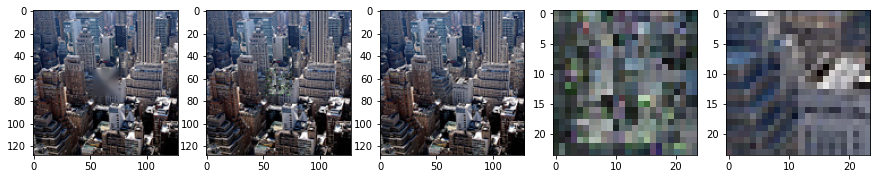

Baseline Acc: 0.73811   Model Acc: 0.54894   Original Image  Generated missing area  Label of missing area


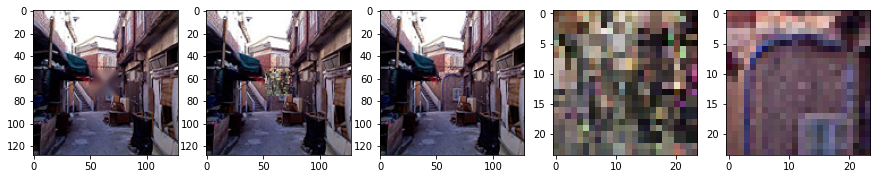

Baseline Acc: 0.68676   Model Acc: 0.49155   Original Image  Generated missing area  Label of missing area


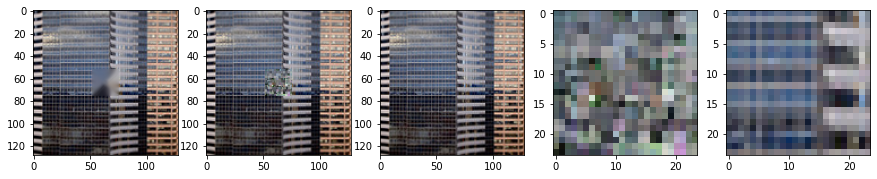

Baseline Acc: 0.62034   Model Acc: 0.49482   Original Image  Generated missing area  Label of missing area


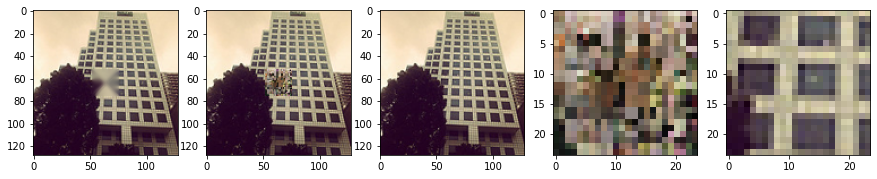

Baseline Acc: 0.48804   Model Acc: 0.30468   Original Image  Generated missing area  Label of missing area


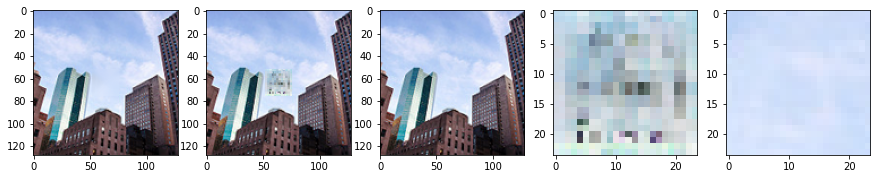

Baseline Acc: 0.95653   Model Acc: 0.6291   Original Image  Generated missing area  Label of missing area


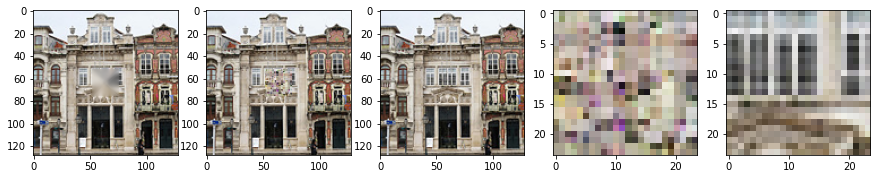

Baseline Acc: 0.40429   Model Acc: 0.39909   Original Image  Generated missing area  Label of missing area


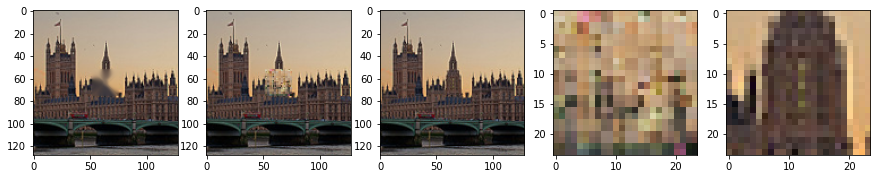

Baseline Acc: 0.60821   Model Acc: 0.37233   Original Image  Generated missing area  Label of missing area


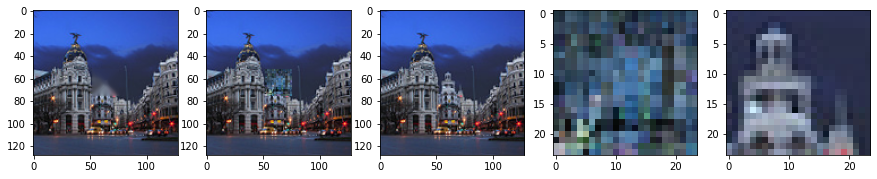

Baseline Acc: 0.73283   Model Acc: 0.5386   Original Image  Generated missing area  Label of missing area


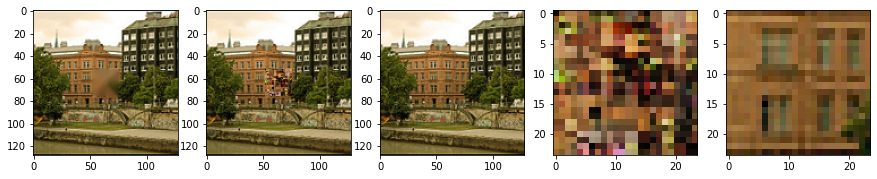

Baseline Acc: 0.77219   Model Acc: 0.53554   Original Image  Generated missing area  Label of missing area


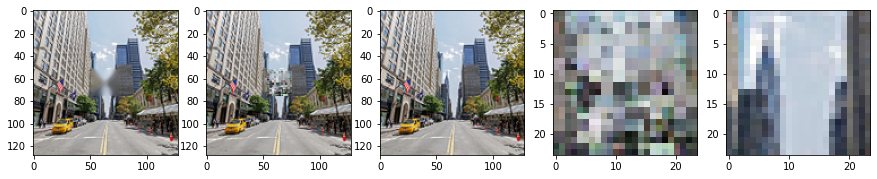

Baseline Acc: 0.59958   Model Acc: 0.39183   Original Image  Generated missing area  Label of missing area


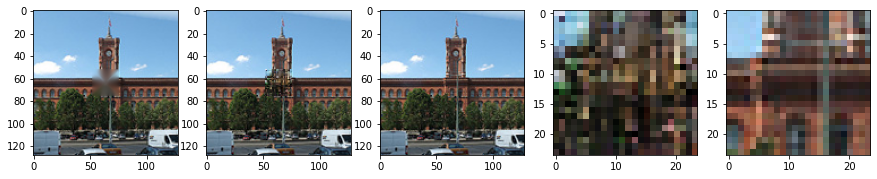

Baseline Acc: 0.66351   Model Acc: 0.49566   Original Image  Generated missing area  Label of missing area


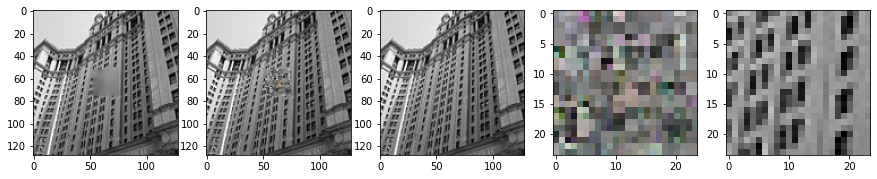

Baseline Acc: 0.59755   Model Acc: 0.45707   Original Image  Generated missing area  Label of missing area


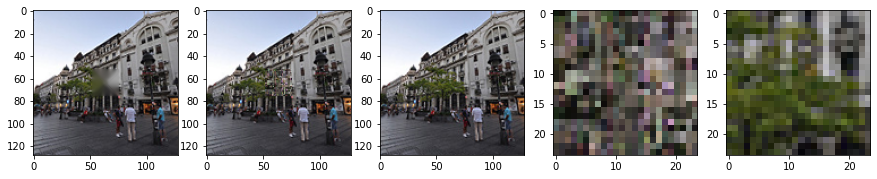

Baseline Acc: 0.64613   Model Acc: 0.52915   Original Image  Generated missing area  Label of missing area


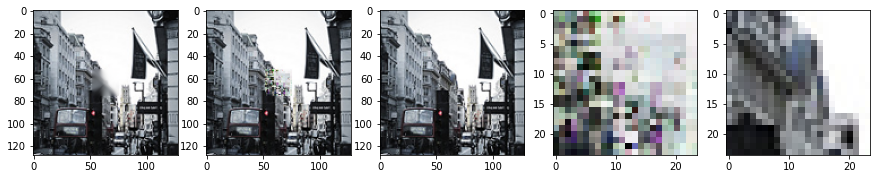

Baseline Acc: 0.55974   Model Acc: 0.32765   Original Image  Generated missing area  Label of missing area


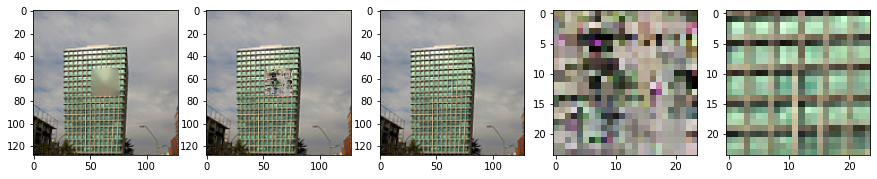

Baseline Acc: 0.5105   Model Acc: 0.35127   Original Image  Generated missing area  Label of missing area


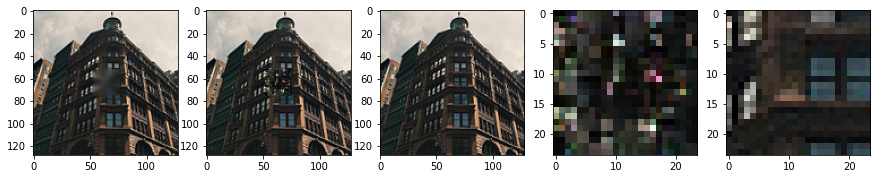

Baseline Acc: 0.71008   Model Acc: 0.60674   Original Image  Generated missing area  Label of missing area


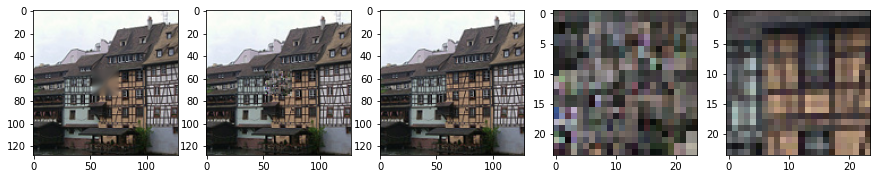

Baseline Acc: 0.67717   Model Acc: 0.56593   Original Image  Generated missing area  Label of missing area


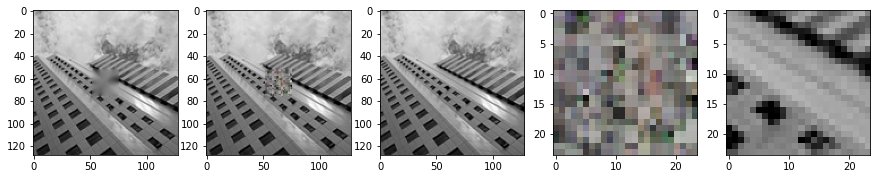

Baseline Acc: 0.57267   Model Acc: 0.45249   Original Image  Generated missing area  Label of missing area


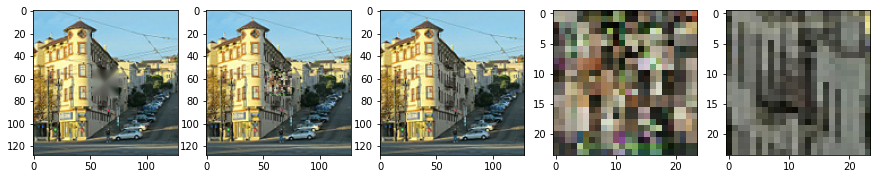

Baseline Acc: 0.60524   Model Acc: 0.3972   Original Image  Generated missing area  Label of missing area


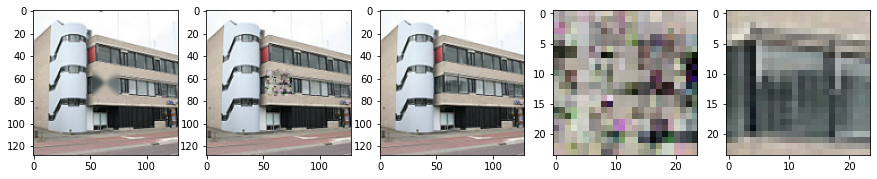

Baseline Acc: 0.59315   Model Acc: 0.41733   Original Image  Generated missing area  Label of missing area


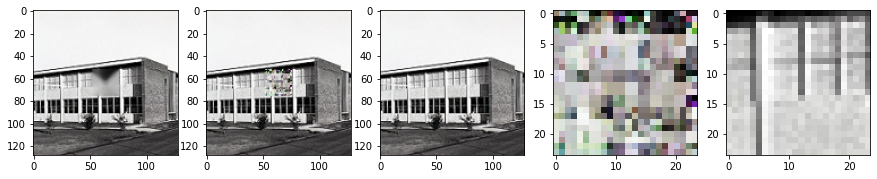

Baseline Acc: 0.33335   Model Acc: 0.31369   Original Image  Generated missing area  Label of missing area


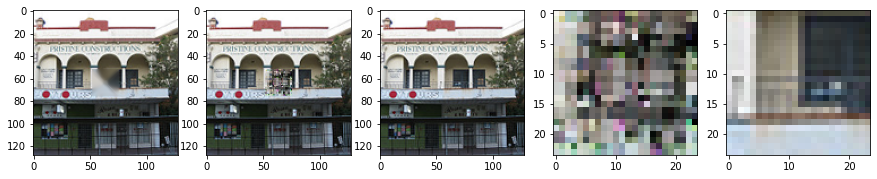

Baseline Acc: 0.64594   Model Acc: 0.40767   Original Image  Generated missing area  Label of missing area


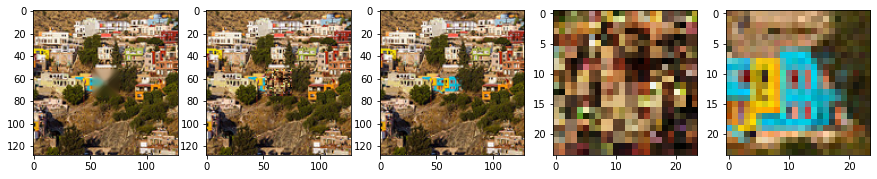

Baseline Acc: 0.41854   Model Acc: 0.24061   Original Image  Generated missing area  Label of missing area
The pixel-wised accuracy on the testing dataset: 0.4358676698591028
The pixel-wised loss on the testing dataset: 106.90890287501472


In [ ]:
# B. create dataset
bs = 32
t_ind = 0.75
v_ind = 0.15
o_num = 16

is_use_cuda = True

t_loader, v_loader, test_loader, overfit_loader = data_loader(bs=bs,
                                                              t_ind=t_ind,
                                                              v_ind=v_ind,
                                                              o_num=o_num,
                                                              dataset=dataset_combined)

with torch.no_grad():
  # change the input to this function to try different datasets
  displayCompare(test_loader, g_model1)

  # compute the accuracy and loss
  loss, acc = compute_pixel_loss_accuracy(g_model1, test_loader, is_use_cuda=True)
  print("The pixel-wised accuracy on the testing dataset:", acc)
  print("The pixel-wised loss on the testing dataset:", loss)

In [ ]:
# compute the accuracy and loss on validation dataset
with torch.no_grad():
  loss, acc = compute_pixel_loss_accuracy(g_model1, v_loader, is_use_cuda=True)
  print("The pixel-wised accuracy on the validation dataset:", acc)
  print("The pixel-wised loss on the validation dataset:", loss)
  print("\tBaseline Acc:", dataset_acc(test_loader))

The pixel-wised accuracy on the validation dataset: 0.4427088673536976
The pixel-wised loss on the validation dataset: 106.52320191264153
	Baseline Acc: 0.6030869377510888


In [ ]:
print("\tBaseline Acc (test dataset):", dataset_acc(test_loader))

	Baseline Acc (test dataset): 0.6074111663869449
